In [3]:
import argparse
import glob
from json.tool import main
import os
import subprocess
import torch
import cv2

import neural_renderer
import matplotlib.pyplot as plt
import numpy as np
import tqdm
import imageio
from skimage.io import imread, imsave
from texture_mapping import MapTexture
from main import StyleTransferModel
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

from torch.optim import lr_scheduler

In [8]:
directory = "/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/scripts/data/"
directory_o = "/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/demo/"

In [9]:
def make_gif(filename):
    with imageio.get_writer(filename, mode='I') as writer:
        for filename in sorted(glob.glob('/tmp/_tmp_*.png')):
            writer.append_data(imageio.imread(filename))
            os.remove(filename)
    writer.close()

In [10]:
def run(filename_mesh, filename_style, filename_output, lambda_style=1, lambda_content=1e5, lambda_tv=1e2, 
        elevation_max=40., elevation_min=20., lr_vertices=0.1, lr_textures=0.001, camera_distance=2.732, 
        camera_distance_noise=0.1, texture_size=4, adam_lr=0.05, adam_beta1=0.5, adam_beta2=0.999, batch_size=4,
        num_iteration=1000, gpu=0, result_directory='./test',optim='Adam', sgd_momentum = 0.9, sgd_decay = 0.1,schedule=True):
    
    # create output directory
    directory_output = os.path.dirname(filename_output)
    if not os.path.exists(directory_output):
        os.makedirs(directory_output)

    np.random.seed(0)

    # setup
    model = StyleTransferModel(
        filename_mesh=filename_mesh,
        filename_style=filename_style,
        lambda_style=lambda_style,
        lambda_content=lambda_content,
        lambda_tv=lambda_tv,
        elevation_max=elevation_max,
        elevation_min=elevation_min,
        lr_vertices=lr_vertices,
        lr_textures=lr_textures,
        camera_distance=camera_distance,
        camera_distance_noise=camera_distance_noise,
        texture_size=texture_size,
    )
    if optim == 'Adam':
        optimizer = torch.optim.Adam([
                    {'params':model.vertices,'lr':lr_vertices},
                    {'params':model.textures,'lr':lr_textures}
                    ], betas=(adam_beta1, adam_beta2))
    elif optim == 'SGD':
        optimizer = torch.optim.SGD([
                    {'params':model.vertices,'lr':lr_vertices},
                    {'params':model.textures,'lr':lr_textures}
                    ], momentum = sgd_momentum, weight_decay=sgd_decay)
    if schedule:
        scheduler =lr_scheduler.MultiStepLR(optimizer, milestones=[25,50,75], gamma=0.1, last_epoch=- 1, verbose=False)
        
    # optimization
    loop = tqdm.tqdm(range(num_iteration))
    history = []
    loops = []
    i = 1
    for _ in loop:
        optimizer.zero_grad()
        loss = model(batch_size)
        history.append(loss)
        loss.backward()
        optimizer.step()
        if schedule:
            scheduler.step()
        loop.set_description('Optimizing. Loss %.4f' % loss.data)
        loops.append(i)
        i +=1

    # draw object
    # model.renderer.background_color = (1, 1, 1)
    print("Saving the object after performing style tra")
    loop = tqdm.tqdm(range(0, 360, 4))
    output_images = []
    for num, azimuth in enumerate(loop):
        loop.set_description('Drawing')
        model.renderer.eye = neural_renderer.get_points_from_angles(2.732, 30, azimuth)

        images,_,_ = model.renderer.render(model.vertices.to(device),model.faces.to(device),torch.tanh(model.textures.to(device)))
        image = images.detach().cpu().numpy()[0].transpose((1, 2, 0))
        imsave('/tmp/_tmp_%04d.png' % num, image)
    make_gif(filename_output)

    print("Saving the object after style transfer.")
    ## Saving the Object
    vertices = model.vertices
    faces = model.state_dict()['faces']
    textures = model.state_dict()['textures']

    filename = "stylized_" + filename_mesh.split("/")[-1]
    # filename = os.path.abspath(filename)
    filename_stylized_obj = result_directory + "/" + filename

    neural_renderer.save_obj(filename_stylized_obj, torch.squeeze(vertices), torch.squeeze(faces), torch.squeeze(textures))

    print("Generating texture mapping for the generated stylized object.")
    ## Mapping the texture
    filename = "stylized_and_textured_" + filename_mesh.split("/")[-1]
    filename_stylized_and_textured_obj = result_directory + "/" + filename
    filename = "stylized_and_textured_" + filename_output.split("/")[-1]
    filename_stylized_and_textured_gif = result_directory + "/" + filename
    map_texture_obj = MapTexture(filename_stylized_obj, filename_style, filename_stylized_and_textured_gif)
    map_texture_obj.train()
    map_texture_obj.save_obj(filename_stylized_and_textured_obj)
    plt.plot(loops, history)

  0%|          | 0/1000 [00:00<?, ?it/s]/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)
Optimizing. Loss 140729.5781: 100%|██████████| 1000/1000 [02:32<00:00,  6.55it/s]


Saving the object after performing style tra


Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0000.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016275854781270027, 0.02550758421421051]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0001.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.015450802631676197, 0.025593150407075882]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0002.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01605462282896042, 0.02517249435186386]. Convert image to uint8 prior to savi

Lossy conversion from float32 to uint8. Range [-0.016573145985603333, 0.02152213826775551]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 34.66it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0024.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01576343923807144, 0.02119058556854725]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 34.66it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0025.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01488710381090641, 0.021319827064871788]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 34.66it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: U

Drawing:  49%|████▉     | 44/90 [00:01<00:01, 35.38it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0047.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.011311769485473633, 0.022031158208847046]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 35.04it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0048.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012053304351866245, 0.021993363276124]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 35.04it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0049.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012061419896781445, 0.022035814821720123]. Convert i

Drawing:  76%|███████▌  | 68/90 [00:02<00:00, 34.68it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0071.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01572687178850174, 0.02641265094280243]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 34.41it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0072.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.015665730461478233, 0.024756640195846558]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 34.41it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0073.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.015835311263799667, 0.024845002219080925]. Convert 

Saving the object after style transfer.
the file name is ./demo/stylized_teapot.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:01<00:01, 36.47it/s]Lossy conversion from float32 to uint8. Range [-0.08170047402381897, 0.8179304599761963]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  82%|████████▏ | 74/90 [00:02<00:00, 37.57it/s]Lossy conversion from float32 to uint8. Range [-0.09043185412883759, 0.8295928239822388]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:02<00:00, 34.67it/s]
Lossy conversion from float32 to uint8. Range [-2.4507572650909424, 2.872112512588501]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./demo/stylized_and_textured_teapot.obj


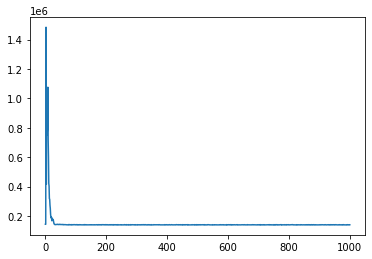

In [11]:
run(directory+"meshes/teapot.obj",
                directory+"styles/gogh2.jpg",
                directory_o+"teapot_demo_1_gogh.gif",
                result_directory='./demo')

  0%|          | 0/100 [00:00<?, ?it/s]/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)
Optimizing. Loss 311112.7188: 100%|██████████| 100/100 [00:24<00:00,  4.15it/s]


Saving the object after performing style tra


Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0000.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01729590818285942, 0.024436406791210175]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0001.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.018128231167793274, 0.02455301582813263]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0002.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01801108941435814, 0.024442657828330994]. Convert image to uint8 prior to savi

Drawing:  27%|██▋       | 24/90 [00:00<00:01, 34.11it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0024.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016596173867583275, 0.020398661494255066]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 34.11it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0025.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01636042445898056, 0.020039360970258713]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 34.11it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0026.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016302824020385742, 0.01990731619298458]. Convert 

Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 32.97it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0048.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012456889264285564, 0.021514257416129112]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 32.97it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0049.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01294273417443037, 0.021220533177256584]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 32.97it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0050.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.013573361560702324, 0.022040527313947678]. Convert

Drawing:  80%|████████  | 72/90 [00:02<00:00, 31.50it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0072.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.017041873186826706, 0.02565814182162285]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 31.50it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0073.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016499534249305725, 0.02432849258184433]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 31.50it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0074.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01725219190120697, 0.02399478107690811]. Convert im

Saving the object after style transfer.
the file name is ./test2/stylized_teapot.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:01, 27.59it/s]Lossy conversion from float32 to uint8. Range [-0.16584038734436035, 0.9699815511703491]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 25.67it/s]Lossy conversion from float32 to uint8. Range [-0.17100593447685242, 0.9538636803627014]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.55it/s]
Lossy conversion from float32 to uint8. Range [-2.754892587661743, 3.2457637786865234]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test2/stylized_and_textured_teapot.obj


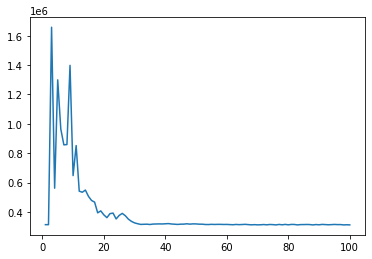

In [11]:
run(directory+"meshes/teapot.obj",
                directory+"styles/coupland1.jpg",
                directory_o+"teapot_demo_1_gogh_coupland.gif",
                result_directory='./test2')

  0%|          | 0/1000 [00:00<?, ?it/s]/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)
Optimizing. Loss 328744.2188: 100%|██████████| 1000/1000 [03:51<00:00,  4.32it/s]


Saving the object after performing style tra


Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0000.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016269737854599953, 0.026158349588513374]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0001.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01702013984322548, 0.02593079023063183]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0002.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01647953875362873, 0.026019401848316193]. Convert image to uint8 prior to savi

Drawing:  27%|██▋       | 24/90 [00:00<00:01, 33.04it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0024.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016952820122241974, 0.02280634641647339]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 33.04it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0025.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016699401661753654, 0.022284604609012604]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 33.04it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0026.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016625571995973587, 0.022011427208781242]. Convert

Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 32.48it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0048.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012755097821354866, 0.02384079620242119]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 32.48it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0049.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.013271057978272438, 0.024503275752067566]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 32.48it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0050.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.013411292806267738, 0.024283019825816154]. Convert

Drawing:  80%|████████  | 72/90 [00:02<00:00, 30.87it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0072.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.018094705417752266, 0.026088040322065353]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 30.87it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0073.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.017729658633470535, 0.02580047771334648]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 30.87it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0074.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.017182741314172745, 0.026055997237563133]. Convert

Saving the object after style transfer.
the file name is ./test2/stylized_teapot.obj
Generating texture mapping for the generated stylized object.


Drawing:  51%|█████     | 46/90 [00:01<00:01, 25.14it/s]Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.30it/s]
Lossy conversion from float32 to uint8. Range [-2.192385196685791, 3.074432611465454]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test2/stylized_and_textured_teapot.obj


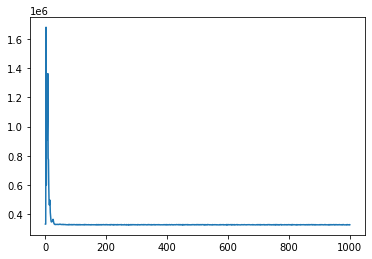

In [15]:
run(directory+"meshes/teapot.obj",
                directory+"styles/gris1.jpg",
                directory_o+"teapot_demo_1_gogh_gris1.gif",
                result_directory='./test2')

  0%|          | 0/100 [00:00<?, ?it/s]/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)
Optimizing. Loss 63374.3281: 100%|██████████| 100/100 [00:23<00:00,  4.28it/s]


Saving the object after performing style tra


Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0000.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01610444486141205, 0.022326264530420303]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0001.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01593438722193241, 0.022129066288471222]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0002.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.017147863283753395, 0.022149331867694855]. Convert image to uint8 prior to sav

Drawing:  27%|██▋       | 24/90 [00:00<00:01, 33.62it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0024.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.015466620214283466, 0.019264398142695427]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 33.62it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0025.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.015194357372820377, 0.02043282613158226]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:00<00:01, 33.62it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0026.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.014669934287667274, 0.019080009311437607]. Convert

Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 33.67it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0048.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.010830717161297798, 0.019812021404504776]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 33.67it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0049.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012299695052206516, 0.020852282643318176]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 33.67it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0050.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012072689831256866, 0.02101730927824974]. Convert

Drawing:  80%|████████  | 72/90 [00:02<00:00, 32.15it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0072.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.015641482546925545, 0.022135429084300995]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 32.15it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0073.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01657796837389469, 0.022411393001675606]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:02<00:00, 32.15it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0074.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016484200954437256, 0.022178061306476593]. Convert

Saving the object after style transfer.
the file name is ./test2/stylized_teapot.obj
Generating texture mapping for the generated stylized object.


Drawing:  39%|███▉      | 35/90 [00:01<00:01, 33.51it/s]Lossy conversion from float32 to uint8. Range [-0.15346261858940125, 0.7795684337615967]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:02<00:00, 31.79it/s]Lossy conversion from float32 to uint8. Range [-0.10274600982666016, 0.7497881054878235]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:02<00:00, 30.33it/s]
Lossy conversion from float32 to uint8. Range [-2.406904935836792, 2.702329397201538]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test2/stylized_and_textured_teapot.obj


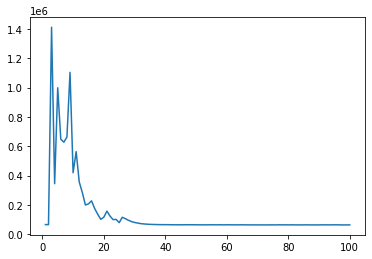

In [13]:

run(directory+"meshes/teapot.obj",
                directory+"styles/picasso.jpg",
                directory_o+"teapot_demo_1_gogh_picasso.gif",
                result_directory='./test2')

In [15]:
def vary_lambda_content_n_style():
    lambda_content_list = [1e2,1e3,1e4,1e5,1e7,1e9,1e10]
    lambda_content_list.reverse()
    lambda_style_list = [1e-3,1e-2,1e-1,1,1e1,1e2,1e3]
    for lc in lambda_content_list:
        for ls in lambda_style_list:
            run(directory+"meshes/bunny.obj",
                directory+"styles/gogh2.jpg",
                directory_o+"bunny_gogh2_demo_1_lc_"+str(lc)+"_ls_"+str(ls)+".gif",
                lambda_content=lc,
                lambda_style=ls)

  0%|          | 0/100 [00:00<?, ?it/s]/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)
Optimizing. Loss 146.1207: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]       


Saving the object after performing style tra


Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0000.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.0033287229016423225, 0.010860878974199295]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0001.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.003887144848704338, 0.010454852133989334]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   2%|▏         | 2/90 [00:00<00:08, 10.61it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0002.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.0038461589720100164, 0.009439567103981972]. Convert image to uint8 

Drawing:  27%|██▋       | 24/90 [00:01<00:03, 16.84it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0024.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.004438548348844051, 0.010970978066325188]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:01<00:03, 16.84it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0025.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.005035845562815666, 0.010011304169893265]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  29%|██▉       | 26/90 [00:01<00:03, 16.49it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0026.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.0030471188947558403, 0.010967656970024109]. Conve

Drawing:  53%|█████▎    | 48/90 [00:03<00:03, 11.97it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0048.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.003522672690451145, 0.012096419930458069]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:03<00:03, 11.97it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0049.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.0034742122516036034, 0.011088971048593521]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  56%|█████▌    | 50/90 [00:03<00:03, 11.34it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0050.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.003350719576701522, 0.009284197352826595]. Conve

Drawing:  80%|████████  | 72/90 [00:05<00:01, 13.27it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0072.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.00317550846375525, 0.0060182614251971245]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:05<00:01, 13.27it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0073.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.0023130103945732117, 0.006078813225030899]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  82%|████████▏ | 74/90 [00:05<00:01, 13.75it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0074.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.0033553726971149445, 0.00589897483587265]. Conve

Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.30it/s]Lossy conversion from float32 to uint8. Range [-0.1959986686706543, 0.7942603230476379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.91it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951368331909]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.78it/s]
Lossy conversion from float32 to uint8. Range [-2.3498270511627197, 2.6311259269714355]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 621637.5625: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.32it/s]Lossy conversion from float32 to uint8. Range [-0.005685911979526281, 0.008043656125664711]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.66it/s]Lossy conversion from float32 to uint8. Range [-0.004951844923198223, 0.008755211718380451]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.21it/s]
Lossy conversion from float32 to uint8. Range [-0.009492033161222935, 0.012212458066642284]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19599869847297668, 0.7942602634429932]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.05it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951368331909]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.86it/s]
Lossy conversion from float32 to uint8. Range [-2.3485212326049805, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 324037.2812: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.32it/s]Lossy conversion from float32 to uint8. Range [-0.006509209517389536, 0.018644992262125015]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:03<00:00, 21.10it/s]Lossy conversion from float32 to uint8. Range [-0.00801733136177063, 0.018917445093393326]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.27it/s]
Lossy conversion from float32 to uint8. Range [-0.014163275249302387, 0.0214507058262825]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.19599869847297668, 0.7942603826522827]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.03it/s]Lossy conversion from float32 to uint8. Range [-0.30619868636131287, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.348609209060669, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136002.7656: 100%|██████████| 100/100 [00:36<00:00,  2.77it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.29it/s]Lossy conversion from float32 to uint8. Range [-0.012536576017737389, 0.020536696538329124]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.97it/s]Lossy conversion from float32 to uint8. Range [-0.013435255736112595, 0.02575387805700302]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.71it/s]
Lossy conversion from float32 to uint8. Range [-0.017697198316454887, 0.026933953166007996]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.93it/s]Lossy conversion from float32 to uint8. Range [-0.19599170982837677, 0.7943019270896912]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.04it/s]Lossy conversion from float32 to uint8. Range [-0.30619820952415466, 0.7443937659263611]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.345808267593384, 2.6310107707977295]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1348032.6250: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.12it/s]Lossy conversion from float32 to uint8. Range [-0.015425212681293488, 0.02200319617986679]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.99it/s]Lossy conversion from float32 to uint8. Range [-0.022267166525125504, 0.028868990018963814]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.69it/s]
Lossy conversion from float32 to uint8. Range [-0.02530316635966301, 0.027654511854052544]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.12it/s]Lossy conversion from float32 to uint8. Range [-0.19601552188396454, 0.7942456007003784]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.92it/s]Lossy conversion from float32 to uint8. Range [-0.3061710000038147, 0.7443956136703491]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.3564705848693848, 2.6310348510742188]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13457666.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.25it/s]Lossy conversion from float32 to uint8. Range [-0.01684768870472908, 0.020750874653458595]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.27it/s]Lossy conversion from float32 to uint8. Range [-0.02120545506477356, 0.027709975838661194]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.79it/s]
Lossy conversion from float32 to uint8. Range [-0.02215348370373249, 0.028774095699191093]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.19755342602729797, 0.7942416667938232]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.06it/s]Lossy conversion from float32 to uint8. Range [-0.29929766058921814, 0.7443474531173706]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.401719331741333, 2.6305456161499023]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134528928.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.42it/s]Lossy conversion from float32 to uint8. Range [-0.01472863182425499, 0.02243911847472191]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.21it/s]Lossy conversion from float32 to uint8. Range [-0.023051714524626732, 0.02829916775226593]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.81it/s]
Lossy conversion from float32 to uint8. Range [-0.024088865146040916, 0.028416071087121964]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.17559850215911865, 0.7942092418670654]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.12it/s]Lossy conversion from float32 to uint8. Range [-0.30461326241493225, 0.7444047331809998]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.80it/s]
Lossy conversion from float32 to uint8. Range [-2.5858383178710938, 2.7715299129486084]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.8503: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]      


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 14.36it/s]Lossy conversion from float32 to uint8. Range [-0.003612640779465437, 0.010026656091213226]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.75it/s]
Lossy conversion from float32 to uint8. Range [-0.009323911741375923, 0.013567431829869747]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.17it/s]Lossy conversion from float32 to uint8. Range [-0.19599872827529907, 0.7942603230476379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.17it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.87it/s]
Lossy conversion from float32 to uint8. Range [-2.34983491897583, 2.6635637283325195]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 63456.4531: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.24it/s]Lossy conversion from float32 to uint8. Range [-0.0056853750720620155, 0.008056258782744408]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.57it/s]Lossy conversion from float32 to uint8. Range [-0.0049425652250647545, 0.008770395070314407]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.15it/s]
Lossy conversion from float32 to uint8. Range [-0.009246084839105606, 0.012257843278348446]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.21it/s]Lossy conversion from float32 to uint8. Range [-0.19599869847297668, 0.7942602634429932]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.30619871616363525, 0.7443951368331909]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.72it/s]
Lossy conversion from float32 to uint8. Range [-2.3485326766967773, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 65610.1250: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.34it/s]Lossy conversion from float32 to uint8. Range [-0.006666985340416431, 0.01820933073759079]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.15it/s]Lossy conversion from float32 to uint8. Range [-0.009161919355392456, 0.01981399767100811]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.23it/s]
Lossy conversion from float32 to uint8. Range [-0.01316936407238245, 0.021271301433444023]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.05it/s]Lossy conversion from float32 to uint8. Range [-0.19599859416484833, 0.794258177280426]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.99it/s]Lossy conversion from float32 to uint8. Range [-0.3061985969543457, 0.7443945407867432]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.80it/s]
Lossy conversion from float32 to uint8. Range [-2.344996452331543, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135999.8281: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.23it/s]Lossy conversion from float32 to uint8. Range [-0.013324358500540257, 0.019754117354750633]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.34it/s]Lossy conversion from float32 to uint8. Range [-0.016749510541558266, 0.026321839541196823]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.79it/s]
Lossy conversion from float32 to uint8. Range [-0.02034701220691204, 0.028442291542887688]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.23it/s]Lossy conversion from float32 to uint8. Range [-0.19576260447502136, 0.7942962050437927]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.19it/s]Lossy conversion from float32 to uint8. Range [-0.3061373233795166, 0.7443934082984924]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.95it/s]
Lossy conversion from float32 to uint8. Range [-2.336664915084839, 2.6310722827911377]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1348111.7500: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.22it/s]Lossy conversion from float32 to uint8. Range [-0.015733404085040092, 0.021775584667921066]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.15it/s]Lossy conversion from float32 to uint8. Range [-0.018846960738301277, 0.02861226722598076]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.75it/s]
Lossy conversion from float32 to uint8. Range [-0.023544885218143463, 0.03021368198096752]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.11it/s]Lossy conversion from float32 to uint8. Range [-0.1961834877729416, 0.7942309975624084]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.98it/s]Lossy conversion from float32 to uint8. Range [-0.29928648471832275, 0.7443996667861938]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.80it/s]
Lossy conversion from float32 to uint8. Range [-2.370647430419922, 2.6559247970581055]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13454922.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.21it/s]Lossy conversion from float32 to uint8. Range [-0.016774430871009827, 0.021054863929748535]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.10it/s]Lossy conversion from float32 to uint8. Range [-0.02277897670865059, 0.02675110287964344]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.71it/s]
Lossy conversion from float32 to uint8. Range [-0.023320501670241356, 0.027020202949643135]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.21it/s]Lossy conversion from float32 to uint8. Range [-0.1775185763835907, 0.7941325306892395]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.01it/s]Lossy conversion from float32 to uint8. Range [-0.29727602005004883, 0.7443163990974426]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.83it/s]
Lossy conversion from float32 to uint8. Range [-2.4823243618011475, 2.622779607772827]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134562144.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.39it/s]Lossy conversion from float32 to uint8. Range [-0.015726283192634583, 0.0227370448410511]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.75it/s]Lossy conversion from float32 to uint8. Range [-0.02045733854174614, 0.026391932740807533]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.76it/s]
Lossy conversion from float32 to uint8. Range [-0.021701520308852196, 0.02695164643228054]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.20it/s]Lossy conversion from float32 to uint8. Range [-0.21539826691150665, 0.7958764433860779]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.93it/s]Lossy conversion from float32 to uint8. Range [-0.27793264389038086, 0.7426287531852722]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.78it/s]
Lossy conversion from float32 to uint8. Range [-2.1652891635894775, 2.682957887649536]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.8166: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 14.42it/s]Lossy conversion from float32 to uint8. Range [-0.0035849353298544884, 0.010014358907938004]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.79it/s]
Lossy conversion from float32 to uint8. Range [-0.009152214974164963, 0.013582729734480381]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.15it/s]Lossy conversion from float32 to uint8. Range [-0.19601114094257355, 0.7942970991134644]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.12it/s]Lossy conversion from float32 to uint8. Range [-0.30613866448402405, 0.7443948984146118]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.90it/s]
Lossy conversion from float32 to uint8. Range [-2.3410634994506836, 2.630986213684082]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 2056.3066: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]   


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.15it/s]Lossy conversion from float32 to uint8. Range [-0.005685870535671711, 0.008014090359210968]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.54it/s]Lossy conversion from float32 to uint8. Range [-0.0050407880917191505, 0.008651837706565857]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.10it/s]
Lossy conversion from float32 to uint8. Range [-0.009253676980733871, 0.01187090203166008]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.12it/s]Lossy conversion from float32 to uint8. Range [-0.1960034966468811, 0.7942782640457153]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.04it/s]Lossy conversion from float32 to uint8. Range [-0.30612874031066895, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.339683771133423, 2.631094217300415]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14246.7803: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.25it/s]Lossy conversion from float32 to uint8. Range [-0.007216084748506546, 0.017312996089458466]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.12it/s]Lossy conversion from float32 to uint8. Range [-0.008914281614124775, 0.022023063153028488]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.21it/s]
Lossy conversion from float32 to uint8. Range [-0.014138977974653244, 0.022535337135195732]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.06it/s]Lossy conversion from float32 to uint8. Range [-0.19631294906139374, 0.7942780256271362]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.3046848177909851, 0.7443815469741821]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.3413643836975098, 2.6312100887298584]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135978.7812: 100%|██████████| 100/100 [00:36<00:00,  2.77it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.08it/s]Lossy conversion from float32 to uint8. Range [-0.01338290236890316, 0.020838819444179535]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.07it/s]Lossy conversion from float32 to uint8. Range [-0.013426183722913265, 0.02530059777200222]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.65it/s]
Lossy conversion from float32 to uint8. Range [-0.018475038930773735, 0.026975130662322044]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.89it/s]Lossy conversion from float32 to uint8. Range [-0.17410075664520264, 0.7941017150878906]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.30438369512557983, 0.7446401715278625]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.233259916305542, 2.623565435409546]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1348703.5000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.25it/s]Lossy conversion from float32 to uint8. Range [-0.01529731135815382, 0.02300407551229]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.25it/s]Lossy conversion from float32 to uint8. Range [-0.02035094052553177, 0.027368366718292236]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.70it/s]
Lossy conversion from float32 to uint8. Range [-0.02245407924056053, 0.028396500274538994]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.23it/s]Lossy conversion from float32 to uint8. Range [-0.21586963534355164, 0.7953898310661316]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.27784082293510437, 0.7425183057785034]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.80it/s]
Lossy conversion from float32 to uint8. Range [-3.0035293102264404, 2.6760075092315674]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13632847.0000: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.28it/s]Lossy conversion from float32 to uint8. Range [-0.015298179350793362, 0.023174669593572617]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.58it/s]Lossy conversion from float32 to uint8. Range [-0.01798868365585804, 0.02610119991004467]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.05it/s]
Lossy conversion from float32 to uint8. Range [-0.021213563159108162, 0.02745828777551651]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.17it/s]Lossy conversion from float32 to uint8. Range [-0.21138225495815277, 0.7990984320640564]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.88it/s]Lossy conversion from float32 to uint8. Range [-0.27997395396232605, 0.746649980545044]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.68it/s]
Lossy conversion from float32 to uint8. Range [-2.5705010890960693, 2.772977113723755]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145647168.0000: 100%|██████████| 100/100 [00:37<00:00,  2.70it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.07it/s]Lossy conversion from float32 to uint8. Range [-0.01795927807688713, 0.022260943427681923]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.05it/s]Lossy conversion from float32 to uint8. Range [-0.016096871346235275, 0.0255579873919487]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.60it/s]
Lossy conversion from float32 to uint8. Range [-0.020785516127943993, 0.026234222576022148]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.41it/s]Lossy conversion from float32 to uint8. Range [-0.2942448556423187, 0.8210299611091614]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.65it/s]Lossy conversion from float32 to uint8. Range [-0.19346891343593597, 0.856532096862793]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.31it/s]
Lossy conversion from float32 to uint8. Range [-2.5137991905212402, 2.9818837642669678]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.7507: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]  


Saving the object after performing style tra


Drawing:  41%|████      | 37/90 [00:02<00:03, 14.10it/s]Lossy conversion from float32 to uint8. Range [-0.005240931175649166, 0.00939980149269104]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:05<00:00, 14.69it/s]Lossy conversion from float32 to uint8. Range [-0.003200405975803733, 0.00968119502067566]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.41it/s]
Lossy conversion from float32 to uint8. Range [-0.008889432065188885, 0.01306811161339283]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.20it/s]Lossy conversion from float32 to uint8. Range [-0.19788092374801636, 0.7939616441726685]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.88it/s]Lossy conversion from float32 to uint8. Range [-0.30517154932022095, 0.744376003742218]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.177604913711548, 2.616586923599243]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1442.2969: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s] 


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.65it/s]Lossy conversion from float32 to uint8. Range [-0.0037194429896771908, 0.007512674201279879]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 15.34it/s]Lossy conversion from float32 to uint8. Range [-0.0044538890942931175, 0.007653095293790102]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.49it/s]
Lossy conversion from float32 to uint8. Range [-0.008578316308557987, 0.011840996332466602]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.18it/s]Lossy conversion from float32 to uint8. Range [-0.1977461874485016, 0.7940033078193665]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.08it/s]Lossy conversion from float32 to uint8. Range [-0.3051239252090454, 0.7446750998497009]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.3128502368927, 2.600128650665283]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13937.4844: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.91it/s]Lossy conversion from float32 to uint8. Range [-0.005224818829447031, 0.018244683742523193]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:03<00:00, 21.14it/s]Lossy conversion from float32 to uint8. Range [-0.007555005140602589, 0.021480700001120567]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.23it/s]
Lossy conversion from float32 to uint8. Range [-0.01215908583253622, 0.02362368442118168]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.18070757389068604, 0.7946330904960632]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.90it/s]Lossy conversion from float32 to uint8. Range [-0.2959684729576111, 0.7581102848052979]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.80it/s]
Lossy conversion from float32 to uint8. Range [-2.090726137161255, 2.629807949066162]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 137558.4844: 100%|██████████| 100/100 [00:36<00:00,  2.77it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.31it/s]Lossy conversion from float32 to uint8. Range [-0.012508363462984562, 0.02226199582219124]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.41it/s]Lossy conversion from float32 to uint8. Range [-0.014049696736037731, 0.023394426330924034]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.06it/s]
Lossy conversion from float32 to uint8. Range [-0.017253328114748, 0.025107167661190033]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.06it/s]Lossy conversion from float32 to uint8. Range [-0.24987971782684326, 0.7945878505706787]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.10it/s]Lossy conversion from float32 to uint8. Range [-0.2853805422782898, 0.7361094355583191]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.3585376739501953, 2.5852291584014893]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1462418.1250: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.19it/s]Lossy conversion from float32 to uint8. Range [-0.01738676056265831, 0.02283257059752941]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.25it/s]Lossy conversion from float32 to uint8. Range [-0.01573244109749794, 0.024781040847301483]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.68it/s]
Lossy conversion from float32 to uint8. Range [-0.020177006721496582, 0.025206036865711212]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.43it/s]Lossy conversion from float32 to uint8. Range [-0.2675250470638275, 0.8395605087280273]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.64it/s]Lossy conversion from float32 to uint8. Range [-0.21245211362838745, 0.8125353455543518]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.32it/s]
Lossy conversion from float32 to uint8. Range [-2.7930831909179688, 2.8162357807159424]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16056179.0000: 100%|██████████| 100/100 [00:40<00:00,  2.45it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:04<00:07,  6.84it/s]Lossy conversion from float32 to uint8. Range [-0.017512138932943344, 0.0262441448867321]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:01,  9.00it/s]Lossy conversion from float32 to uint8. Range [-0.01704336330294609, 0.03375603258609772]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.24it/s]
/home/nv2095/.local/lib/python3.6/site-packages/neural_renderer_pytorch-1.1.3-py3.6-linux-x86_64.egg/neural_renderer/save_obj.py:50: UserWarning: ./test/stylized_bunny.png is a low contrast image
  imsave(filename_texture, texture_image)
Lossy conversion from float32 to uint8. Range [-0.022860821336507797, 0.03379512578248978]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.56it/s]Lossy conversion from float32 to uint8. Range [-0.24800799787044525, 0.8890969753265381]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 10.02it/s]Lossy conversion from float32 to uint8. Range [-0.33946114778518677, 0.8864536285400391]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.11it/s]
Lossy conversion from float32 to uint8. Range [-3.4576938152313232, 3.3865551948547363]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 147047200.0000: 100%|██████████| 100/100 [00:42<00:00,  2.35it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:16,  3.20it/s]Lossy conversion from float32 to uint8. Range [-0.011517873965203762, 0.028839295729994774]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:04,  3.06it/s]Lossy conversion from float32 to uint8. Range [-0.01852935552597046, 0.0296389851719141]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.18it/s]
Lossy conversion from float32 to uint8. Range [-0.022301191464066505, 0.028720153495669365]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.50it/s]Lossy conversion from float32 to uint8. Range [-0.26509085297584534, 0.8811678290367126]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:01,  7.41it/s]Lossy conversion from float32 to uint8. Range [-0.2769644856452942, 0.8126670718193054]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:11<00:00,  7.91it/s]
Lossy conversion from float32 to uint8. Range [-3.1109135150909424, 3.2234551906585693]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.7645: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s] 


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:02, 17.97it/s]Lossy conversion from float32 to uint8. Range [-0.003010587999597192, 0.006090203300118446]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 15.40it/s]
Lossy conversion from float32 to uint8. Range [-0.010550071485340595, 0.010927225463092327]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.05it/s]Lossy conversion from float32 to uint8. Range [-0.20391137897968292, 0.7940382361412048]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.05it/s]Lossy conversion from float32 to uint8. Range [-0.29630497097969055, 0.7680983543395996]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.82it/s]
Lossy conversion from float32 to uint8. Range [-2.0459530353546143, 2.6382219791412354]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1436.4988: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s] 


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.76it/s]Lossy conversion from float32 to uint8. Range [-0.004236549139022827, 0.006989416666328907]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 15.17it/s]Lossy conversion from float32 to uint8. Range [-0.00373286847025156, 0.009836846962571144]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.72it/s]
Lossy conversion from float32 to uint8. Range [-0.009514092467725277, 0.011375732719898224]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.05it/s]Lossy conversion from float32 to uint8. Range [-0.17592911422252655, 0.7940624952316284]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.2908741235733032, 0.7685806751251221]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.73it/s]
Lossy conversion from float32 to uint8. Range [-2.4960134029388428, 2.623744487762451]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14008.1172: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.78it/s]Lossy conversion from float32 to uint8. Range [-0.0052257017232477665, 0.017799638211727142]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.01it/s]Lossy conversion from float32 to uint8. Range [-0.007966051809489727, 0.019700832664966583]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.51it/s]
Lossy conversion from float32 to uint8. Range [-0.01444679219275713, 0.022057292982935905]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.18it/s]Lossy conversion from float32 to uint8. Range [-0.20464617013931274, 0.7887442111968994]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.93it/s]Lossy conversion from float32 to uint8. Range [-0.266167014837265, 0.7430559992790222]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.90it/s]
Lossy conversion from float32 to uint8. Range [-2.6029319763183594, 2.5568387508392334]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 147897.8438: 100%|██████████| 100/100 [00:37<00:00,  2.69it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 24.96it/s]Lossy conversion from float32 to uint8. Range [-0.012101355008780956, 0.022702941671013832]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.01it/s]Lossy conversion from float32 to uint8. Range [-0.014775540679693222, 0.02494366466999054]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.53it/s]
Lossy conversion from float32 to uint8. Range [-0.017684083431959152, 0.024778291583061218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.39it/s]Lossy conversion from float32 to uint8. Range [-0.5635023713111877, 0.8388615846633911]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.43it/s]Lossy conversion from float32 to uint8. Range [-0.1992199420928955, 0.8200359344482422]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.22it/s]
Lossy conversion from float32 to uint8. Range [-2.6278610229492188, 2.678799867630005]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1613951.3750: 100%|██████████| 100/100 [00:42<00:00,  2.34it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:08,  6.19it/s]Lossy conversion from float32 to uint8. Range [-0.014950195327401161, 0.03221235051751137]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:10<00:02,  6.46it/s]Lossy conversion from float32 to uint8. Range [-0.018871452659368515, 0.032683003693819046]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:13<00:00,  6.82it/s]
Lossy conversion from float32 to uint8. Range [-0.019225485622882843, 0.03226977586746216]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:03, 13.16it/s]Lossy conversion from float32 to uint8. Range [-0.37361717224121094, 0.8265665769577026]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:01, 11.57it/s]Lossy conversion from float32 to uint8. Range [-0.36960822343826294, 0.808090090751648]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.05it/s]
Lossy conversion from float32 to uint8. Range [-2.8594796657562256, 3.4456591606140137]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 15133670.0000: 100%|██████████| 100/100 [00:45<00:00,  2.20it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:09<00:14,  3.67it/s]Lossy conversion from float32 to uint8. Range [-0.013975471258163452, 0.026531996205449104]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:20<00:03,  3.68it/s]Lossy conversion from float32 to uint8. Range [-0.017530297860503197, 0.027784114703536034]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:23<00:00,  3.85it/s]
Lossy conversion from float32 to uint8. Range [-0.020676854997873306, 0.027884293347597122]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:04, 10.65it/s]Lossy conversion from float32 to uint8. Range [-0.1780647337436676, 0.8325145244598389]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:07<00:01, 10.46it/s]Lossy conversion from float32 to uint8. Range [-0.08194056898355484, 0.7880071997642517]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.92it/s]
Lossy conversion from float32 to uint8. Range [-3.5068905353546143, 2.8937082290649414]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 137739760.0000: 100%|██████████| 100/100 [00:47<00:00,  2.10it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:17,  2.90it/s]Lossy conversion from float32 to uint8. Range [-0.011222070083022118, 0.024982396513223648]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:02,  4.71it/s]Lossy conversion from float32 to uint8. Range [-0.018714454025030136, 0.035161733627319336]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:24<00:00,  3.65it/s]
Lossy conversion from float32 to uint8. Range [-0.01872400753200054, 0.0347331240773201]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.52it/s]Lossy conversion from float32 to uint8. Range [-0.17631804943084717, 0.7971814870834351]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:00, 13.18it/s]Lossy conversion from float32 to uint8. Range [-0.04803463816642761, 0.7767934799194336]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.84it/s]
Lossy conversion from float32 to uint8. Range [-3.7186925411224365, 3.058814764022827]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 147.9877: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s] 


Saving the object after performing style tra


Drawing:  41%|████      | 37/90 [00:02<00:02, 18.68it/s]Lossy conversion from float32 to uint8. Range [-0.004853536374866962, 0.005143831484019756]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 16.26it/s]
Lossy conversion from float32 to uint8. Range [-0.008795741014182568, 0.01328273769468069]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.20it/s]Lossy conversion from float32 to uint8. Range [-0.22049885988235474, 0.792911946773529]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.82it/s]Lossy conversion from float32 to uint8. Range [-0.29687660932540894, 0.7417939305305481]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.6566483974456787, 2.4056029319763184]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1438.0179: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:01<00:02, 20.65it/s]Lossy conversion from float32 to uint8. Range [-0.003264870960265398, 0.004941354505717754]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 18.24it/s]
Lossy conversion from float32 to uint8. Range [-0.009229306131601334, 0.01244388334453106]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.21806123852729797, 0.7987439632415771]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.92it/s]Lossy conversion from float32 to uint8. Range [-0.3050891160964966, 0.7583299279212952]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.7294764518737793, 2.621381998062134]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14979.0166: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:02, 17.65it/s]Lossy conversion from float32 to uint8. Range [-0.0040777684189379215, 0.017943458631634712]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:04<00:00, 17.76it/s]Lossy conversion from float32 to uint8. Range [-0.003305875463411212, 0.023291803896427155]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 17.23it/s]
Lossy conversion from float32 to uint8. Range [-0.009856433607637882, 0.02271146886050701]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 21.28it/s]Lossy conversion from float32 to uint8. Range [-0.202761709690094, 0.8427802920341492]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:03<00:00, 18.70it/s]Lossy conversion from float32 to uint8. Range [-0.2782934010028839, 0.8172510862350464]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.38it/s]
Lossy conversion from float32 to uint8. Range [-2.4681167602539062, 3.0556187629699707]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 167648.3438: 100%|██████████| 100/100 [00:48<00:00,  2.08it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:08<00:11,  4.60it/s]Lossy conversion from float32 to uint8. Range [-0.011308489367365837, 0.0385507196187973]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:16<00:02,  4.50it/s]Lossy conversion from float32 to uint8. Range [-0.013583578169345856, 0.03907971829175949]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:19<00:00,  4.59it/s]
Lossy conversion from float32 to uint8. Range [-0.017466822639107704, 0.03715956583619118]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05, 10.49it/s]Lossy conversion from float32 to uint8. Range [-0.28003576397895813, 0.8038538694381714]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  7.96it/s]Lossy conversion from float32 to uint8. Range [-0.33256790041923523, 0.7840784788131714]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.88it/s]
Lossy conversion from float32 to uint8. Range [-3.2265594005584717, 3.3225080966949463]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1490626.2500: 100%|██████████| 100/100 [00:45<00:00,  2.22it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:09<00:13,  3.83it/s]Lossy conversion from float32 to uint8. Range [-0.014465185813605785, 0.031511954963207245]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:04,  3.12it/s]Lossy conversion from float32 to uint8. Range [-0.014873119071125984, 0.03181775286793709]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:25<00:00,  3.54it/s]
Lossy conversion from float32 to uint8. Range [-0.01925034262239933, 0.03152616322040558]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:05,  9.50it/s]Lossy conversion from float32 to uint8. Range [-0.2983524799346924, 0.7556032538414001]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01,  9.98it/s]Lossy conversion from float32 to uint8. Range [-0.11601392924785614, 0.7445654273033142]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.67it/s]
Lossy conversion from float32 to uint8. Range [-3.2830147743225098, 3.1347200870513916]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13858331.0000: 100%|██████████| 100/100 [00:43<00:00,  2.32it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:16,  3.23it/s]Lossy conversion from float32 to uint8. Range [-0.009892463684082031, 0.021046016365289688]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:02,  4.43it/s]Lossy conversion from float32 to uint8. Range [-0.019078241661190987, 0.030221877619624138]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:25<00:00,  3.57it/s]
Lossy conversion from float32 to uint8. Range [-0.01919277012348175, 0.029689360409975052]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:02<00:04, 11.73it/s]Lossy conversion from float32 to uint8. Range [-0.17047299444675446, 0.7629562616348267]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 12.67it/s]Lossy conversion from float32 to uint8. Range [-0.09000801295042038, 0.7530372142791748]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.00it/s]
Lossy conversion from float32 to uint8. Range [-2.4672505855560303, 2.986973285675049]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135023904.0000: 100%|██████████| 100/100 [00:41<00:00,  2.39it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:16,  3.07it/s]Lossy conversion from float32 to uint8. Range [-0.012928029522299767, 0.024456173181533813]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:04,  3.06it/s]Lossy conversion from float32 to uint8. Range [-0.019220681861042976, 0.030250918120145798]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.10it/s]
Lossy conversion from float32 to uint8. Range [-0.02008383348584175, 0.03051203116774559]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 12.65it/s]Lossy conversion from float32 to uint8. Range [-0.1849820762872696, 0.8382569551467896]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 12.98it/s]Lossy conversion from float32 to uint8. Range [-0.12645012140274048, 0.740004301071167]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.45it/s]
Lossy conversion from float32 to uint8. Range [-2.4151668548583984, 2.9053871631622314]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 256.1126: 100%|██████████| 100/100 [00:39<00:00,  2.55it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.56it/s]Lossy conversion from float32 to uint8. Range [-0.003231915645301342, 0.006216023117303848]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:03<00:00, 20.34it/s]Lossy conversion from float32 to uint8. Range [-0.004193399101495743, 0.0068870424292981625]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.21it/s]
Lossy conversion from float32 to uint8. Range [-0.010277661494910717, 0.013117250986397266]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.50it/s]Lossy conversion from float32 to uint8. Range [-0.22530357539653778, 0.8173832297325134]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.69it/s]Lossy conversion from float32 to uint8. Range [-0.25278034806251526, 0.8190189599990845]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.17it/s]
Lossy conversion from float32 to uint8. Range [-2.768739938735962, 2.9218430519104004]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1551.1193: 100%|██████████| 100/100 [00:39<00:00,  2.55it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:01<00:02, 21.16it/s]Lossy conversion from float32 to uint8. Range [-0.004366314969956875, 0.007318940944969654]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.35it/s]
Lossy conversion from float32 to uint8. Range [-0.00964790303260088, 0.011613487266004086]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.39it/s]Lossy conversion from float32 to uint8. Range [-0.2172660529613495, 0.8401240110397339]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.50it/s]Lossy conversion from float32 to uint8. Range [-0.11333390325307846, 0.8069033622741699]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.03it/s]
Lossy conversion from float32 to uint8. Range [-2.335327625274658, 2.9387948513031006]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16567.6680: 100%|██████████| 100/100 [00:42<00:00,  2.38it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:08<00:10,  4.82it/s]Lossy conversion from float32 to uint8. Range [-0.004422743804752827, 0.021310074254870415]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:17<00:03,  3.80it/s]Lossy conversion from float32 to uint8. Range [-0.003487899899482727, 0.026307230815291405]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:20<00:00,  4.36it/s]
Lossy conversion from float32 to uint8. Range [-0.010373865254223347, 0.022421155124902725]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:04<00:04, 10.73it/s]Lossy conversion from float32 to uint8. Range [-0.2155928909778595, 0.8176510334014893]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  9.34it/s]Lossy conversion from float32 to uint8. Range [-0.44761577248573303, 0.798408031463623]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.21it/s]
Lossy conversion from float32 to uint8. Range [-3.018319606781006, 3.5039608478546143]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 148866.6406: 100%|██████████| 100/100 [00:44<00:00,  2.25it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:09<00:13,  3.78it/s]Lossy conversion from float32 to uint8. Range [-0.009502062574028969, 0.02701219916343689]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:20<00:04,  3.25it/s]Lossy conversion from float32 to uint8. Range [-0.011832165531814098, 0.027443770319223404]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:24<00:00,  3.75it/s]
Lossy conversion from float32 to uint8. Range [-0.014712061733007431, 0.027918342500925064]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:02<00:04, 12.31it/s]Lossy conversion from float32 to uint8. Range [-0.24268010258674622, 0.8111088275909424]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.74it/s]Lossy conversion from float32 to uint8. Range [-0.18957003951072693, 0.7892612218856812]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 13.10it/s]
Lossy conversion from float32 to uint8. Range [-3.0416316986083984, 3.1758973598480225]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1357918.3750: 100%|██████████| 100/100 [00:43<00:00,  2.32it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:16,  3.18it/s]Lossy conversion from float32 to uint8. Range [-0.00880906730890274, 0.024034377187490463]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:03,  3.45it/s]Lossy conversion from float32 to uint8. Range [-0.016613297164440155, 0.029830489307641983]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:27<00:00,  3.32it/s]
Lossy conversion from float32 to uint8. Range [-0.016988836228847504, 0.031229203566908836]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 10.78it/s]Lossy conversion from float32 to uint8. Range [-0.2283555418252945, 0.8205759525299072]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:01, 11.97it/s]Lossy conversion from float32 to uint8. Range [-0.23096998035907745, 0.8069713711738586]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.87it/s]
Lossy conversion from float32 to uint8. Range [-2.692732810974121, 2.7263453006744385]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13397809.0000: 100%|██████████| 100/100 [00:43<00:00,  2.32it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:15,  3.30it/s]Lossy conversion from float32 to uint8. Range [-0.016866860911250114, 0.021616455167531967]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:04,  3.19it/s]Lossy conversion from float32 to uint8. Range [-0.016846131533384323, 0.025186989456415176]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.21it/s]
Lossy conversion from float32 to uint8. Range [-0.01756485365331173, 0.025572989135980606]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:03, 13.16it/s]Lossy conversion from float32 to uint8. Range [-0.22870348393917084, 0.777534008026123]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:01, 13.28it/s]Lossy conversion from float32 to uint8. Range [-0.18843963742256165, 0.7803746461868286]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.44it/s]
Lossy conversion from float32 to uint8. Range [-2.5268361568450928, 2.5906982421875]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135001216.0000: 100%|██████████| 100/100 [00:44<00:00,  2.25it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:14,  3.58it/s]Lossy conversion from float32 to uint8. Range [-0.010899420827627182, 0.023266058415174484]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:03,  3.45it/s]Lossy conversion from float32 to uint8. Range [-0.01753835193812847, 0.028104698285460472]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.45it/s]
Lossy conversion from float32 to uint8. Range [-0.017642328515648842, 0.028489992022514343]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:05,  9.65it/s]Lossy conversion from float32 to uint8. Range [-0.1942249834537506, 0.8115735054016113]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01, 10.86it/s]Lossy conversion from float32 to uint8. Range [-0.22377625107765198, 0.834141194820404]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.96it/s]
Lossy conversion from float32 to uint8. Range [-2.947225332260132, 3.0104379653930664]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


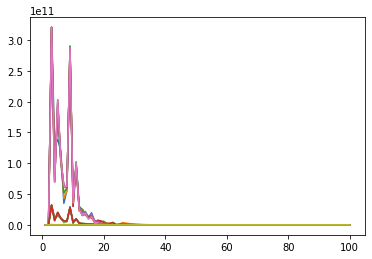

In [16]:
vary_lambda_content_n_style()

In [19]:
def vary_lambda_content_n_style():
    lambda_content_list = [1e2,1e3,1e4,1e5,1e7,1e9,1e10]
    lambda_content_list.reverse()
    lambda_style_list = [1e-3,1e-2,1e-1,1,1e1,1e2,1e3]
    lambda_tv_list = [1e-1,1,1e1,1e2]
    for lc in lambda_content_list:
        for ls in lambda_style_list:
            for tv in lambda_tv_list:
                run(directory+"meshes/bunny.obj",
                    directory+"styles/gogh2.jpg",
                    directory_o+"bunny_gogh2_demo_1_lc_"+str(lc)+"_ls_"+str(ls)+"_ltv_"+str(tv)+".gif",
                    lambda_content=lc,
                    lambda_style=ls,
                    lambda_tv=tv)

  0%|          | 0/100 [00:00<?, ?it/s]/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/scratch/nv2095/new_project/StyleTransferUsingNeuralRenderer/style_transfer/src/main/StyleLoss.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)
Optimizing. Loss 310183.7188: 100%|██████████| 100/100 [00:37<00:00,  2.70it/s]     


Saving the object after performing style tra


Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0000.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.014437679201364517, 0.02709781937301159]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0001.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.014367574825882912, 0.025406843051314354]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:   0%|          | 0/90 [00:00<?, ?it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0002.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012631533667445183, 0.025748448446393013]. Convert image to uint8 prior to sa

Lossy conversion from float32 to uint8. Range [-0.011993855237960815, 0.020986054092645645]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:01<00:02, 24.30it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0024.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012944217771291733, 0.02082988992333412]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:01<00:02, 24.30it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0025.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.01216395664960146, 0.020508093759417534]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  27%|██▋       | 24/90 [00:01<00:02, 24.30it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69:

Drawing:  50%|█████     | 45/90 [00:01<00:01, 24.33it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0047.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.011143620125949383, 0.020796995609998703]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:01<00:01, 23.69it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0048.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.011393069289624691, 0.02126714400947094]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  53%|█████▎    | 48/90 [00:02<00:01, 23.69it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0049.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.012687057256698608, 0.022781692445278168]. Convert

Lossy conversion from float32 to uint8. Range [-0.015648525208234787, 0.026519257575273514]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  77%|███████▋  | 69/90 [00:03<00:00, 22.15it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0071.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.015595721080899239, 0.025634270161390305]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:03<00:00, 22.16it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:69: UserWarning: /tmp/_tmp_0072.png is a low contrast image
Lossy conversion from float32 to uint8. Range [-0.016207225620746613, 0.025970490649342537]. Convert image to uint8 prior to saving to suppress this warning.
Drawing:  80%|████████  | 72/90 [00:03<00:00, 22.16it/s]/scratch/nv2095/project/penv/lib/python3.6/site-packages/ipykernel_launcher.py:6

Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.12it/s]Lossy conversion from float32 to uint8. Range [-0.19599685072898865, 0.7942916750907898]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.06it/s]Lossy conversion from float32 to uint8. Range [-0.3061980605125427, 0.7443934082984924]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.82it/s]
Lossy conversion from float32 to uint8. Range [-2.3478198051452637, 2.646648645401001]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 307478.4375: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 20.83it/s]Lossy conversion from float32 to uint8. Range [-0.007938417606055737, 0.01834939233958721]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.70it/s]Lossy conversion from float32 to uint8. Range [-0.008695816621184349, 0.01921461895108223]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.85it/s]
Lossy conversion from float32 to uint8. Range [-0.01528855413198471, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.00it/s]Lossy conversion from float32 to uint8. Range [-0.19599685072898865, 0.7942917346954346]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.87it/s]Lossy conversion from float32 to uint8. Range [-0.3061980605125427, 0.7443933486938477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.67it/s]
Lossy conversion from float32 to uint8. Range [-2.34822416305542, 2.6466493606567383]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 620314.4375: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.36it/s]Lossy conversion from float32 to uint8. Range [-0.004202432464808226, 0.008640159852802753]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.69it/s]
Lossy conversion from float32 to uint8. Range [-0.0115891695022583, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19599869847297668, 0.7942603230476379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.99it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443952560424805]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.3485209941864014, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 146.1167: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]       


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 14.33it/s]Lossy conversion from float32 to uint8. Range [-0.003615480847656727, 0.010022925212979317]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.69it/s]
Lossy conversion from float32 to uint8. Range [-0.009337635710835457, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.09it/s]Lossy conversion from float32 to uint8. Range [-0.19599874317646027, 0.7942602634429932]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.93it/s]Lossy conversion from float32 to uint8. Range [-0.30619868636131287, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.76it/s]
Lossy conversion from float32 to uint8. Range [-2.3498268127441406, 2.6311259269714355]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1347.0417: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]      


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.09it/s]Lossy conversion from float32 to uint8. Range [-0.014780117198824883, 0.023930978029966354]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.91it/s]Lossy conversion from float32 to uint8. Range [-0.018807724118232727, 0.0282669048756361]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.60it/s]
Lossy conversion from float32 to uint8. Range [-0.02468172460794449, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.19it/s]Lossy conversion from float32 to uint8. Range [-0.19599685072898865, 0.7942916750907898]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.81it/s]Lossy conversion from float32 to uint8. Range [-0.3061980605125427, 0.7443933486938477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.73it/s]
Lossy conversion from float32 to uint8. Range [-2.3492512702941895, 2.646648406982422]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1359.9866: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]      


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.25it/s]Lossy conversion from float32 to uint8. Range [-0.012314007617533207, 0.019904427230358124]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.17it/s]Lossy conversion from float32 to uint8. Range [-0.015044569037854671, 0.026241471990942955]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.67it/s]
Lossy conversion from float32 to uint8. Range [-0.020166201516985893, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.04it/s]Lossy conversion from float32 to uint8. Range [-0.19599685072898865, 0.7942917346954346]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.97it/s]Lossy conversion from float32 to uint8. Range [-0.3061981201171875, 0.7443933486938477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.3478200435638428, 2.646648645401001]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1459.9860: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]       


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.03it/s]Lossy conversion from float32 to uint8. Range [-0.006472707726061344, 0.01907995343208313]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.74it/s]Lossy conversion from float32 to uint8. Range [-0.01059019099920988, 0.020029980689287186]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.82it/s]
Lossy conversion from float32 to uint8. Range [-0.01377364806830883, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.06it/s]Lossy conversion from float32 to uint8. Range [-0.19599869847297668, 0.7942603230476379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.02it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.3486084938049316, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 621637.5625: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.22it/s]Lossy conversion from float32 to uint8. Range [-0.00546290073543787, 0.007906708866357803]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.71it/s]Lossy conversion from float32 to uint8. Range [-0.004944140091538429, 0.008509992621839046]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.19it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.011862469837069511]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.05it/s]Lossy conversion from float32 to uint8. Range [-0.19599871337413788, 0.7942602634429932]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.03it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.3485207557678223, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 116857.2812: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.19it/s]Lossy conversion from float32 to uint8. Range [-0.017043443396687508, 0.023249533027410507]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.13it/s]Lossy conversion from float32 to uint8. Range [-0.020362265408039093, 0.027516499161720276]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.79it/s]
Lossy conversion from float32 to uint8. Range [-0.02403668686747551, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.04it/s]Lossy conversion from float32 to uint8. Range [-0.19599682092666626, 0.7943020462989807]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.84it/s]Lossy conversion from float32 to uint8. Range [-0.3061980605125427, 0.7443933486938477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.66it/s]
Lossy conversion from float32 to uint8. Range [-2.3492610454559326, 2.6466500759124756]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13474.8496: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.14it/s]Lossy conversion from float32 to uint8. Range [-0.014853326603770256, 0.022030817344784737]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.05it/s]Lossy conversion from float32 to uint8. Range [-0.01982354372739792, 0.02743697166442871]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.70it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.02832452766597271]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.19599685072898865, 0.7943019866943359]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.05it/s]Lossy conversion from float32 to uint8. Range [-0.3061981201171875, 0.7443942427635193]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.85it/s]
Lossy conversion from float32 to uint8. Range [-2.3492610454559326, 2.6466562747955322]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 116979.2812: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.32it/s]Lossy conversion from float32 to uint8. Range [-0.012847676873207092, 0.02021973207592964]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.04it/s]Lossy conversion from float32 to uint8. Range [-0.013916647993028164, 0.026186440140008926]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.71it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.026033246889710426]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19599688053131104, 0.7943019866943359]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.96it/s]Lossy conversion from float32 to uint8. Range [-0.3061980605125427, 0.7443933486938477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.345799446105957, 2.6399941444396973]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 225333.1094: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.52it/s]Lossy conversion from float32 to uint8. Range [-0.006391038186848164, 0.01796332746744156]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.98it/s]Lossy conversion from float32 to uint8. Range [-0.009960218332707882, 0.0191953182220459]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.34it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.022322295233607292]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.19it/s]Lossy conversion from float32 to uint8. Range [-0.19599872827529907, 0.7942604422569275]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.85it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951368331909]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.83it/s]
Lossy conversion from float32 to uint8. Range [-2.3486084938049316, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134545.5781: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.02it/s]Lossy conversion from float32 to uint8. Range [-0.01573074236512184, 0.022595588117837906]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.07it/s]Lossy conversion from float32 to uint8. Range [-0.01863253489136696, 0.028158418834209442]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.66it/s]
Lossy conversion from float32 to uint8. Range [-0.02095959521830082, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.19599179923534393, 0.7942928671836853]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.96it/s]Lossy conversion from float32 to uint8. Range [-0.3061913251876831, 0.7443935871124268]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.3478379249572754, 2.6330432891845703]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134516.2969: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.16it/s]Lossy conversion from float32 to uint8. Range [-0.01748596504330635, 0.023934636265039444]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.00it/s]Lossy conversion from float32 to uint8. Range [-0.019445011392235756, 0.027496514841914177]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.70it/s]
Lossy conversion from float32 to uint8. Range [-0.020660623908042908, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.18it/s]Lossy conversion from float32 to uint8. Range [-0.19599659740924835, 0.7942599058151245]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.02it/s]Lossy conversion from float32 to uint8. Range [-0.30619871616363525, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.348214864730835, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134739.2031: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.09it/s]Lossy conversion from float32 to uint8. Range [-0.01511526107788086, 0.022381126880645752]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.13it/s]Lossy conversion from float32 to uint8. Range [-0.023843279108405113, 0.028364477679133415]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.73it/s]
Lossy conversion from float32 to uint8. Range [-0.025041453540325165, 0.027657877653837204]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.15it/s]Lossy conversion from float32 to uint8. Range [-0.1959860622882843, 0.7942894101142883]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.30619126558303833, 0.7443941831588745]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.3478381633758545, 2.6310055255889893]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135989.5312: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.14it/s]Lossy conversion from float32 to uint8. Range [-0.011412177234888077, 0.02029869519174099]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.09it/s]Lossy conversion from float32 to uint8. Range [-0.017751138657331467, 0.024865135550498962]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.69it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.62it/s]Lossy conversion from float32 to uint8. Range [-0.19599346816539764, 0.7943031787872314]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.89it/s]Lossy conversion from float32 to uint8. Range [-0.3062000572681427, 0.7443943023681641]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.64it/s]
Lossy conversion from float32 to uint8. Range [-2.345808267593384, 2.6400022506713867]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1345642.1250: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.24it/s]Lossy conversion from float32 to uint8. Range [-0.015428506769239902, 0.024131743237376213]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.23it/s]Lossy conversion from float32 to uint8. Range [-0.019901543855667114, 0.03034227527678013]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.75it/s]
Lossy conversion from float32 to uint8. Range [-0.023073934018611908, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.11it/s]Lossy conversion from float32 to uint8. Range [-0.19576647877693176, 0.7943243384361267]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.12it/s]Lossy conversion from float32 to uint8. Range [-0.3061913251876831, 0.7443950772285461]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.84it/s]
Lossy conversion from float32 to uint8. Range [-2.34464955329895, 2.6654739379882812]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1345783.6250: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.24it/s]Lossy conversion from float32 to uint8. Range [-0.01554707158356905, 0.021762941032648087]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.28it/s]Lossy conversion from float32 to uint8. Range [-0.01982974074780941, 0.029711253941059113]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.80it/s]
Lossy conversion from float32 to uint8. Range [-0.02184968627989292, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.07it/s]Lossy conversion from float32 to uint8. Range [-0.19578607380390167, 0.7942783832550049]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.02it/s]Lossy conversion from float32 to uint8. Range [-0.3061498999595642, 0.7443935871124268]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.72it/s]
Lossy conversion from float32 to uint8. Range [-2.3529555797576904, 2.6651785373687744]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1345993.2500: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.22it/s]Lossy conversion from float32 to uint8. Range [-0.01655612885951996, 0.021489517763257027]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.26it/s]Lossy conversion from float32 to uint8. Range [-0.01971743442118168, 0.02865956351161003]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.80it/s]
Lossy conversion from float32 to uint8. Range [-0.02178153768181801, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.66it/s]Lossy conversion from float32 to uint8. Range [-0.19576668739318848, 0.7938332557678223]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.96it/s]Lossy conversion from float32 to uint8. Range [-0.30618035793304443, 0.7443968057632446]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.67it/s]
Lossy conversion from float32 to uint8. Range [-2.344369649887085, 2.6309328079223633]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1347316.3750: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.02it/s]Lossy conversion from float32 to uint8. Range [-0.015064375475049019, 0.021772978827357292]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.98it/s]Lossy conversion from float32 to uint8. Range [-0.02223333716392517, 0.02682935632765293]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.53it/s]
Lossy conversion from float32 to uint8. Range [-0.023808788508176804, 0.028161734342575073]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.18it/s]Lossy conversion from float32 to uint8. Range [-0.19575875997543335, 0.7942801117897034]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.3061596155166626, 0.7444005608558655]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.3527989387512207, 2.6307032108306885]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13464168.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.03it/s]Lossy conversion from float32 to uint8. Range [-0.01532744336873293, 0.02306448295712471]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.87it/s]Lossy conversion from float32 to uint8. Range [-0.02160494588315487, 0.028732120990753174]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.60it/s]
Lossy conversion from float32 to uint8. Range [-0.025666959583759308, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.00it/s]Lossy conversion from float32 to uint8. Range [-0.19750255346298218, 0.7942575812339783]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.08it/s]Lossy conversion from float32 to uint8. Range [-0.2993208169937134, 0.7444039583206177]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.76it/s]
Lossy conversion from float32 to uint8. Range [-2.364061117172241, 2.6304445266723633]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13456179.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.04it/s]Lossy conversion from float32 to uint8. Range [-0.015723206102848053, 0.022944580763578415]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.06it/s]Lossy conversion from float32 to uint8. Range [-0.02248830907046795, 0.02780856192111969]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.65it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.028214680030941963]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.04it/s]Lossy conversion from float32 to uint8. Range [-0.1974981278181076, 0.7942138314247131]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.85it/s]Lossy conversion from float32 to uint8. Range [-0.2993258237838745, 0.7443472743034363]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.69it/s]
Lossy conversion from float32 to uint8. Range [-2.358245849609375, 2.6311683654785156]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13453853.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.36it/s]Lossy conversion from float32 to uint8. Range [-0.015759307891130447, 0.022997019812464714]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.24it/s]Lossy conversion from float32 to uint8. Range [-0.021912451833486557, 0.029125237837433815]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.87it/s]
Lossy conversion from float32 to uint8. Range [-0.023306027054786682, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.20it/s]Lossy conversion from float32 to uint8. Range [-0.19743183255195618, 0.7942532300949097]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.93it/s]Lossy conversion from float32 to uint8. Range [-0.2993886470794678, 0.744397759437561]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.78it/s]
Lossy conversion from float32 to uint8. Range [-2.3740627765655518, 2.631237268447876]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13459234.0000: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.26it/s]Lossy conversion from float32 to uint8. Range [-0.01663164049386978, 0.021764587610960007]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.33it/s]Lossy conversion from float32 to uint8. Range [-0.019054464995861053, 0.02702343463897705]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.86it/s]
Lossy conversion from float32 to uint8. Range [-0.021994808688759804, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.01it/s]Lossy conversion from float32 to uint8. Range [-0.19755315780639648, 0.794245719909668]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.2993038594722748, 0.744399905204773]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.414809465408325, 2.6313416957855225]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134546400.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.08it/s]Lossy conversion from float32 to uint8. Range [-0.015495548956096172, 0.022269144654273987]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.03it/s]Lossy conversion from float32 to uint8. Range [-0.021278269588947296, 0.029648393392562866]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.66it/s]
Lossy conversion from float32 to uint8. Range [-0.023307014256715775, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.05it/s]Lossy conversion from float32 to uint8. Range [-0.17645642161369324, 0.7942219972610474]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.89it/s]Lossy conversion from float32 to uint8. Range [-0.3014736771583557, 0.7442955374717712]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.68it/s]
Lossy conversion from float32 to uint8. Range [-2.499741315841675, 2.6229090690612793]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134590496.0000: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 24.93it/s]Lossy conversion from float32 to uint8. Range [-0.015019811689853668, 0.02231442742049694]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.05it/s]Lossy conversion from float32 to uint8. Range [-0.021984988823533058, 0.028534378856420517]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.59it/s]
Lossy conversion from float32 to uint8. Range [-0.023319875821471214, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.07it/s]Lossy conversion from float32 to uint8. Range [-0.17627523839473724, 0.7939693927764893]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.284934937953949, 0.744057297706604]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.71it/s]
Lossy conversion from float32 to uint8. Range [-1.9564703702926636, 2.6227803230285645]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134553888.0000: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.31it/s]Lossy conversion from float32 to uint8. Range [-0.01564227044582367, 0.022190410643815994]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.23it/s]Lossy conversion from float32 to uint8. Range [-0.020796194672584534, 0.029485082253813744]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.85it/s]
Lossy conversion from float32 to uint8. Range [-0.023076293990015984, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.08it/s]Lossy conversion from float32 to uint8. Range [-0.17714114487171173, 0.7938747406005859]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.96it/s]Lossy conversion from float32 to uint8. Range [-0.29934826493263245, 0.7440433502197266]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.429859161376953, 2.6227478981018066]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134527248.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 24.34it/s]Lossy conversion from float32 to uint8. Range [-0.015283123590052128, 0.021781763061881065]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.05it/s]Lossy conversion from float32 to uint8. Range [-0.020056985318660736, 0.029185477644205093]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.56it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.028430011123418808]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.92it/s]Lossy conversion from float32 to uint8. Range [-0.17611460387706757, 0.7942032217979431]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.2947731614112854, 0.7440364360809326]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.649993419647217, 2.8442676067352295]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 31140.3887: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.10it/s]Lossy conversion from float32 to uint8. Range [-0.012975132092833519, 0.02135557308793068]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.13it/s]Lossy conversion from float32 to uint8. Range [-0.013210033997893333, 0.02506963536143303]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.68it/s]
Lossy conversion from float32 to uint8. Range [-0.02838456816971302, 0.0273581612855196]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.09it/s]Lossy conversion from float32 to uint8. Range [-0.19599688053131104, 0.7942917346954346]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.98it/s]Lossy conversion from float32 to uint8. Range [-0.3061981499195099, 0.7443933486938477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.73it/s]
Lossy conversion from float32 to uint8. Range [-2.3478198051452637, 2.646648645401001]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 31115.2422: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.39it/s]Lossy conversion from float32 to uint8. Range [-0.006500727962702513, 0.01800660975277424]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.73it/s]Lossy conversion from float32 to uint8. Range [-0.007669856771826744, 0.019462332129478455]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.25it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.0207559484988451]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.74it/s]Lossy conversion from float32 to uint8. Range [-0.19599685072898865, 0.794291615486145]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.02it/s]Lossy conversion from float32 to uint8. Range [-0.3061981499195099, 0.7443934679031372]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.348223924636841, 2.646649122238159]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 62160.9805: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.51it/s]Lossy conversion from float32 to uint8. Range [-0.004297386389225721, 0.008467021398246288]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.72it/s]
Lossy conversion from float32 to uint8. Range [-0.011591440998017788, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.16it/s]Lossy conversion from float32 to uint8. Range [-0.19599871337413788, 0.7942603230476379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.06it/s]Lossy conversion from float32 to uint8. Range [-0.3061986267566681, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.83it/s]
Lossy conversion from float32 to uint8. Range [-2.3485209941864014, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.8391: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]      


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 14.30it/s]Lossy conversion from float32 to uint8. Range [-0.0036054132506251335, 0.010030128061771393]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.68it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.01357270311564207]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.15it/s]Lossy conversion from float32 to uint8. Range [-0.19599872827529907, 0.7942603230476379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.86it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951368331909]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.34983491897583, 2.6635637283325195]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1346.8604: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.12it/s]Lossy conversion from float32 to uint8. Range [-0.015076418407261372, 0.02408888377249241]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.10it/s]Lossy conversion from float32 to uint8. Range [-0.01924237236380577, 0.027271756902337074]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.64it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.02868386171758175]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.16it/s]Lossy conversion from float32 to uint8. Range [-0.19599683582782745, 0.7943019866943359]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.3061981201171875, 0.7443937659263611]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.80it/s]
Lossy conversion from float32 to uint8. Range [-2.3492610454559326, 2.6466498374938965]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1362.4705: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.20it/s]Lossy conversion from float32 to uint8. Range [-0.012125605717301369, 0.019705669954419136]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.13it/s]Lossy conversion from float32 to uint8. Range [-0.013913089409470558, 0.025712167844176292]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.71it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.027904637157917023]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19599686563014984, 0.7942922115325928]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.81it/s]Lossy conversion from float32 to uint8. Range [-0.3061981201171875, 0.7443934679031372]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.69it/s]
Lossy conversion from float32 to uint8. Range [-2.345808267593384, 2.646648645401001]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1395.3392: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]      


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 20.83it/s]Lossy conversion from float32 to uint8. Range [-0.007255569566041231, 0.019096534699201584]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.07it/s]Lossy conversion from float32 to uint8. Range [-0.010700147598981857, 0.019751977175474167]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.89it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.020830431953072548]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19599871337413788, 0.7942602634429932]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.97it/s]Lossy conversion from float32 to uint8. Range [-0.3061986565589905, 0.7443951964378357]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.3486084938049316, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 63456.4531: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.11it/s]Lossy conversion from float32 to uint8. Range [-0.005683829542249441, 0.008057408034801483]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.58it/s]Lossy conversion from float32 to uint8. Range [-0.004920848645269871, 0.00876988098025322]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.11it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.012274311855435371]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.19599872827529907, 0.7942602634429932]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.92it/s]Lossy conversion from float32 to uint8. Range [-0.30619868636131287, 0.7443951368331909]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.3485326766967773, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 44462.1484: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.21it/s]Lossy conversion from float32 to uint8. Range [-0.016833167523145676, 0.02241550199687481]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.27it/s]Lossy conversion from float32 to uint8. Range [-0.020568374544382095, 0.027501199394464493]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.82it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.028654910624027252]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.12it/s]Lossy conversion from float32 to uint8. Range [-0.1959887444972992, 0.7942736744880676]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.01it/s]Lossy conversion from float32 to uint8. Range [-0.3061932921409607, 0.7443950772285461]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.78it/s]
Lossy conversion from float32 to uint8. Range [-2.348215341567993, 2.6311252117156982]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13474.4863: 100%|██████████| 100/100 [00:36<00:00,  2.78it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.17it/s]Lossy conversion from float32 to uint8. Range [-0.015078172087669373, 0.022031042724847794]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.18it/s]Lossy conversion from float32 to uint8. Range [-0.02013007551431656, 0.027139931917190552]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.78it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.028753649443387985]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.17it/s]Lossy conversion from float32 to uint8. Range [-0.1959885060787201, 0.7942697405815125]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.09it/s]Lossy conversion from float32 to uint8. Range [-0.3061986267566681, 0.7443953156471252]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.83it/s]
Lossy conversion from float32 to uint8. Range [-2.348215341567993, 2.6311259269714355]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13601.5488: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.18it/s]Lossy conversion from float32 to uint8. Range [-0.012524796649813652, 0.020128322765231133]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.21it/s]Lossy conversion from float32 to uint8. Range [-0.013366498053073883, 0.024735212326049805]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.78it/s]
Lossy conversion from float32 to uint8. Range [-0.01989159546792507, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.17it/s]Lossy conversion from float32 to uint8. Range [-0.19599853456020355, 0.7943089604377747]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.05it/s]Lossy conversion from float32 to uint8. Range [-0.30619582533836365, 0.7443946003913879]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.3458104133605957, 2.645946741104126]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 44950.1055: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.54it/s]Lossy conversion from float32 to uint8. Range [-0.006836653221398592, 0.017485426738858223]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 20.92it/s]Lossy conversion from float32 to uint8. Range [-0.009133106097579002, 0.020126469433307648]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.32it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.021896706894040108]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.1959986835718155, 0.7942563891410828]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.04it/s]Lossy conversion from float32 to uint8. Range [-0.3061985969543457, 0.7443946003913879]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.343872547149658, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134538.6094: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.08it/s]Lossy conversion from float32 to uint8. Range [-0.0164214875549078, 0.02405622787773609]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.11it/s]Lossy conversion from float32 to uint8. Range [-0.01904410868883133, 0.029432449489831924]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.75it/s]
Lossy conversion from float32 to uint8. Range [-0.021404260769486427, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.98it/s]Lossy conversion from float32 to uint8. Range [-0.19575285911560059, 0.7942701578140259]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.90it/s]Lossy conversion from float32 to uint8. Range [-0.306155264377594, 0.7443984746932983]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.3524200916290283, 2.650190591812134]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134569.1562: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.25it/s]Lossy conversion from float32 to uint8. Range [-0.01673908904194832, 0.023340623825788498]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.41it/s]Lossy conversion from float32 to uint8. Range [-0.022767305374145508, 0.02877497673034668]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.86it/s]
Lossy conversion from float32 to uint8. Range [-0.023304635658860207, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.09it/s]Lossy conversion from float32 to uint8. Range [-0.1957494616508484, 0.7942681312561035]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.82it/s]Lossy conversion from float32 to uint8. Range [-0.30611997842788696, 0.7443918585777283]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.62it/s]
Lossy conversion from float32 to uint8. Range [-2.347231864929199, 2.631260633468628]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134777.5938: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.23it/s]Lossy conversion from float32 to uint8. Range [-0.015496422536671162, 0.021725144237279892]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.27it/s]Lossy conversion from float32 to uint8. Range [-0.023034509271383286, 0.02653568983078003]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.80it/s]
Lossy conversion from float32 to uint8. Range [-0.023478712886571884, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.04it/s]Lossy conversion from float32 to uint8. Range [-0.19576090574264526, 0.7942553162574768]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.92it/s]Lossy conversion from float32 to uint8. Range [-0.3061736822128296, 0.7443923354148865]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.76it/s]
Lossy conversion from float32 to uint8. Range [-2.355126142501831, 2.6309850215911865]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135935.9531: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.32it/s]Lossy conversion from float32 to uint8. Range [-0.012782933190464973, 0.020386792719364166]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.20it/s]Lossy conversion from float32 to uint8. Range [-0.0164338406175375, 0.026000458747148514]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.78it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.028661703690886497]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.94it/s]Lossy conversion from float32 to uint8. Range [-0.19575241208076477, 0.7943055629730225]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.11it/s]Lossy conversion from float32 to uint8. Range [-0.3061375617980957, 0.7443957924842834]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.78it/s]
Lossy conversion from float32 to uint8. Range [-2.3351383209228516, 2.6518924236297607]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1345753.3750: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.37it/s]Lossy conversion from float32 to uint8. Range [-0.015943115577101707, 0.022549675777554512]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.24it/s]Lossy conversion from float32 to uint8. Range [-0.01963610202074051, 0.029766762629151344]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.84it/s]
Lossy conversion from float32 to uint8. Range [-0.02277049981057644, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.11it/s]Lossy conversion from float32 to uint8. Range [-0.19751662015914917, 0.7942763566970825]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.76it/s]Lossy conversion from float32 to uint8. Range [-0.30606764554977417, 0.7444000840187073]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.71it/s]
Lossy conversion from float32 to uint8. Range [-2.3598549365997314, 2.63092041015625]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1345867.7500: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.22it/s]Lossy conversion from float32 to uint8. Range [-0.01616395264863968, 0.022966912016272545]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.96it/s]Lossy conversion from float32 to uint8. Range [-0.019013188779354095, 0.029657235369086266]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.72it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.026816481724381447]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.12it/s]Lossy conversion from float32 to uint8. Range [-0.19742542505264282, 0.7942227125167847]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.09it/s]Lossy conversion from float32 to uint8. Range [-0.2993534505367279, 0.7443925738334656]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.81it/s]
Lossy conversion from float32 to uint8. Range [-2.3923568725585938, 2.6404361724853516]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1345628.8750: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.10it/s]Lossy conversion from float32 to uint8. Range [-0.01714562624692917, 0.022076910361647606]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.14it/s]Lossy conversion from float32 to uint8. Range [-0.02034851536154747, 0.029890010133385658]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.79it/s]
Lossy conversion from float32 to uint8. Range [-0.025061093270778656, 0.028068995103240013]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.05it/s]Lossy conversion from float32 to uint8. Range [-0.19720524549484253, 0.7942230701446533]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.82it/s]Lossy conversion from float32 to uint8. Range [-0.3061017096042633, 0.7444034814834595]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.61it/s]
Lossy conversion from float32 to uint8. Range [-2.3473095893859863, 2.6308794021606445]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1348142.1250: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.27it/s]Lossy conversion from float32 to uint8. Range [-0.014905067160725594, 0.022648412734270096]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.14it/s]Lossy conversion from float32 to uint8. Range [-0.018287336453795433, 0.02761981450021267]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.76it/s]
Lossy conversion from float32 to uint8. Range [-0.023326219990849495, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.16it/s]Lossy conversion from float32 to uint8. Range [-0.196214497089386, 0.7942399978637695]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.96it/s]Lossy conversion from float32 to uint8. Range [-0.2993217408657074, 0.7443945407867432]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.4151272773742676, 2.630699872970581]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13466348.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.19it/s]Lossy conversion from float32 to uint8. Range [-0.015716958791017532, 0.02210884913802147]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.15it/s]Lossy conversion from float32 to uint8. Range [-0.021750804036855698, 0.028296731412410736]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.76it/s]
Lossy conversion from float32 to uint8. Range [-0.02282721735537052, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.1757914125919342, 0.7939637303352356]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.92it/s]Lossy conversion from float32 to uint8. Range [-0.2850247621536255, 0.7440186142921448]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.6598527431488037, 2.62459659576416]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13459994.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.29it/s]Lossy conversion from float32 to uint8. Range [-0.015892263501882553, 0.022547991946339607]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.28it/s]Lossy conversion from float32 to uint8. Range [-0.02086237259209156, 0.028491031378507614]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.89it/s]
Lossy conversion from float32 to uint8. Range [-0.022557444870471954, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.10it/s]Lossy conversion from float32 to uint8. Range [-0.17761707305908203, 0.7941698431968689]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.03it/s]Lossy conversion from float32 to uint8. Range [-0.28535038232803345, 0.744401216506958]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.85it/s]
Lossy conversion from float32 to uint8. Range [-2.5276079177856445, 2.623915433883667]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13454189.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.34it/s]Lossy conversion from float32 to uint8. Range [-0.014414661563932896, 0.022935662418603897]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.36it/s]Lossy conversion from float32 to uint8. Range [-0.021382886916399002, 0.028520826250314713]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.87it/s]
Lossy conversion from float32 to uint8. Range [-0.021793417632579803, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.99it/s]Lossy conversion from float32 to uint8. Range [-0.17634497582912445, 0.7941298484802246]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.92it/s]Lossy conversion from float32 to uint8. Range [-0.2943825125694275, 0.7443100214004517]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.67it/s]
Lossy conversion from float32 to uint8. Range [-1.9447190761566162, 2.6226956844329834]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13454633.0000: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 24.99it/s]Lossy conversion from float32 to uint8. Range [-0.01701185666024685, 0.020511459559202194]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.51it/s]Lossy conversion from float32 to uint8. Range [-0.02033882774412632, 0.02753688395023346]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.53it/s]
Lossy conversion from float32 to uint8. Range [-0.023079251870512962, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.12it/s]Lossy conversion from float32 to uint8. Range [-0.1769290566444397, 0.7942322492599487]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.3057924211025238, 0.7444294691085815]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.71it/s]
Lossy conversion from float32 to uint8. Range [-2.32146954536438, 2.6234259605407715]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134622944.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.31it/s]Lossy conversion from float32 to uint8. Range [-0.015326115302741528, 0.022296242415905]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.31it/s]Lossy conversion from float32 to uint8. Range [-0.01965606026351452, 0.02609589509665966]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.80it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.02769935131072998]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.12it/s]Lossy conversion from float32 to uint8. Range [-0.21467433869838715, 0.7962543964385986]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.98it/s]Lossy conversion from float32 to uint8. Range [-0.2773659825325012, 0.7473742961883545]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.0528547763824463, 2.601087808609009]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134608720.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.15it/s]Lossy conversion from float32 to uint8. Range [-0.016008730977773666, 0.022327134385704994]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.14it/s]Lossy conversion from float32 to uint8. Range [-0.019089270383119583, 0.027189938351511955]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.67it/s]
Lossy conversion from float32 to uint8. Range [-0.02153604105114937, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.21it/s]Lossy conversion from float32 to uint8. Range [-0.19583216309547424, 0.7955169081687927]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.09it/s]Lossy conversion from float32 to uint8. Range [-0.27531442046165466, 0.7603110074996948]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.85it/s]
Lossy conversion from float32 to uint8. Range [-3.4187610149383545, 2.657153844833374]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134609040.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.25it/s]Lossy conversion from float32 to uint8. Range [-0.015959573909640312, 0.02305535413324833]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.99it/s]Lossy conversion from float32 to uint8. Range [-0.019048787653446198, 0.027260053902864456]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.64it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.029530908912420273]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19725917279720306, 0.7943103313446045]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.97it/s]Lossy conversion from float32 to uint8. Range [-0.2781437635421753, 0.7627646923065186]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.76it/s]
Lossy conversion from float32 to uint8. Range [-2.64614200592041, 2.590073585510254]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134513312.0000: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.09it/s]Lossy conversion from float32 to uint8. Range [-0.015507673844695091, 0.023194022476673126]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.04it/s]Lossy conversion from float32 to uint8. Range [-0.02150171808898449, 0.027688123285770416]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.71it/s]
Lossy conversion from float32 to uint8. Range [-0.027726061642169952, 0.0274116899818182]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.11it/s]Lossy conversion from float32 to uint8. Range [-0.19653378427028656, 0.7948841452598572]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.12it/s]Lossy conversion from float32 to uint8. Range [-0.2742927074432373, 0.7424474954605103]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.89it/s]
Lossy conversion from float32 to uint8. Range [-2.0751614570617676, 2.6747682094573975]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 446.0290: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.16it/s]Lossy conversion from float32 to uint8. Range [-0.012386240996420383, 0.021562250331044197]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.09it/s]Lossy conversion from float32 to uint8. Range [-0.012785732746124268, 0.026600630953907967]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.72it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.027186712250113487]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.09it/s]Lossy conversion from float32 to uint8. Range [-0.19599135220050812, 0.794293999671936]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.30619871616363525, 0.7443944215774536]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.70it/s]
Lossy conversion from float32 to uint8. Range [-2.346323013305664, 2.63100528717041]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 448.5307: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]     


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.08it/s]Lossy conversion from float32 to uint8. Range [-0.00776288565248251, 0.018079493194818497]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.01it/s]Lossy conversion from float32 to uint8. Range [-0.009178212843835354, 0.019154872745275497]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.04it/s]
Lossy conversion from float32 to uint8. Range [-0.02838456816971302, 0.021372603252530098]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19599683582782745, 0.7942866086959839]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.84it/s]Lossy conversion from float32 to uint8. Range [-0.3061980605125427, 0.7443933486938477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.68it/s]
Lossy conversion from float32 to uint8. Range [-2.343904495239258, 2.6310107707977295]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 763.7861: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.39it/s]Lossy conversion from float32 to uint8. Range [-0.004282663576304913, 0.008615322411060333]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 15.58it/s]Lossy conversion from float32 to uint8. Range [-0.0024588804226368666, 0.009835198521614075]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.69it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.019787121564149857]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.13it/s]Lossy conversion from float32 to uint8. Range [-0.19599872827529907, 0.7942661046981812]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.96it/s]Lossy conversion from float32 to uint8. Range [-0.30619871616363525, 0.7443951368331909]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.75it/s]
Lossy conversion from float32 to uint8. Range [-2.3466544151306152, 2.6311256885528564]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.8022: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]    


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 14.35it/s]Lossy conversion from float32 to uint8. Range [-0.003580115269869566, 0.010006802156567574]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.70it/s]
Lossy conversion from float32 to uint8. Range [-0.009152204729616642, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.10it/s]Lossy conversion from float32 to uint8. Range [-0.19601114094257355, 0.7942970991134644]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.91it/s]Lossy conversion from float32 to uint8. Range [-0.30613863468170166, 0.7443948984146118]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.3410637378692627, 2.630986213684082]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1347.3868: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.19it/s]Lossy conversion from float32 to uint8. Range [-0.014910019934177399, 0.02541268616914749]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.24it/s]Lossy conversion from float32 to uint8. Range [-0.01905008964240551, 0.028303001075983047]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.75it/s]
Lossy conversion from float32 to uint8. Range [-0.044155534356832504, 0.029325338080525398]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.09it/s]Lossy conversion from float32 to uint8. Range [-0.1957785040140152, 0.7942776679992676]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.29941195249557495, 0.7443957328796387]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.76it/s]
Lossy conversion from float32 to uint8. Range [-2.3526663780212402, 2.6502275466918945]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1876.5950: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.19it/s]Lossy conversion from float32 to uint8. Range [-0.012384628877043724, 0.01995607279241085]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.33it/s]Lossy conversion from float32 to uint8. Range [-0.013140397146344185, 0.02580730803310871]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.76it/s]
Lossy conversion from float32 to uint8. Range [-0.018488237634301186, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.15it/s]Lossy conversion from float32 to uint8. Range [-0.1957710087299347, 0.7943061590194702]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.97it/s]Lossy conversion from float32 to uint8. Range [-0.3061245083808899, 0.7443955540657043]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.74it/s]
Lossy conversion from float32 to uint8. Range [-2.343209743499756, 2.6312594413757324]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1392.4624: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]    


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 20.89it/s]Lossy conversion from float32 to uint8. Range [-0.005364850163459778, 0.019314736127853394]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.04it/s]Lossy conversion from float32 to uint8. Range [-0.009479545056819916, 0.019595995545387268]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.95it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.02118583768606186]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.10it/s]Lossy conversion from float32 to uint8. Range [-0.19597840309143066, 0.7942668199539185]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.30619847774505615, 0.7443938255310059]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.71it/s]
Lossy conversion from float32 to uint8. Range [-2.3441460132598877, 2.6311349868774414]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 2056.3064: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]   


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.11it/s]Lossy conversion from float32 to uint8. Range [-0.005689993500709534, 0.007734251208603382]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.66it/s]Lossy conversion from float32 to uint8. Range [-0.00500350259244442, 0.008274348452687263]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.11it/s]
Lossy conversion from float32 to uint8. Range [-0.009238267317414284, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.14it/s]Lossy conversion from float32 to uint8. Range [-0.19600346684455872, 0.7942781448364258]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.94it/s]Lossy conversion from float32 to uint8. Range [-0.30612874031066895, 0.7443953156471252]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.79it/s]
Lossy conversion from float32 to uint8. Range [-2.339683771133423, 2.631337881088257]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13451.8926: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.06it/s]Lossy conversion from float32 to uint8. Range [-0.016900520771741867, 0.021304786205291748]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.30it/s]Lossy conversion from float32 to uint8. Range [-0.020411191508173943, 0.02829047106206417]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.80it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.028957512229681015]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.02it/s]Lossy conversion from float32 to uint8. Range [-0.19619572162628174, 0.7942340970039368]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.20it/s]Lossy conversion from float32 to uint8. Range [-0.29933518171310425, 0.7443491220474243]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.83it/s]
Lossy conversion from float32 to uint8. Range [-2.3655178546905518, 2.6404054164886475]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13478.4873: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.07it/s]Lossy conversion from float32 to uint8. Range [-0.01539374515414238, 0.021658750250935555]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.23it/s]Lossy conversion from float32 to uint8. Range [-0.018668461591005325, 0.027235044166445732]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.80it/s]
Lossy conversion from float32 to uint8. Range [-0.021644655615091324, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.11it/s]Lossy conversion from float32 to uint8. Range [-0.19620324671268463, 0.7942622303962708]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.32it/s]Lossy conversion from float32 to uint8. Range [-0.29937395453453064, 0.7443974018096924]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.85it/s]
Lossy conversion from float32 to uint8. Range [-2.3599393367767334, 2.6307272911071777]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13599.7764: 100%|██████████| 100/100 [00:36<00:00,  2.78it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.22it/s]Lossy conversion from float32 to uint8. Range [-0.013129739090800285, 0.02037505991756916]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.51it/s]Lossy conversion from float32 to uint8. Range [-0.018019380047917366, 0.024377942085266113]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.92it/s]
Lossy conversion from float32 to uint8. Range [-0.020665574818849564, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.24it/s]Lossy conversion from float32 to uint8. Range [-0.19558589160442352, 0.7942915558815002]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.91it/s]Lossy conversion from float32 to uint8. Range [-0.3061732351779938, 0.7443946599960327]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.74it/s]
Lossy conversion from float32 to uint8. Range [-2.3318655490875244, 2.631181001663208]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13930.1973: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 22.45it/s]Lossy conversion from float32 to uint8. Range [-0.006639121565967798, 0.017579520121216774]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:03<00:00, 21.87it/s]Lossy conversion from float32 to uint8. Range [-0.010336321778595448, 0.020316798239946365]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.01it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.021171795204281807]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.01it/s]Lossy conversion from float32 to uint8. Range [-0.19633996486663818, 0.7942483425140381]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.56it/s]Lossy conversion from float32 to uint8. Range [-0.30473792552948, 0.7443852424621582]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.53it/s]
Lossy conversion from float32 to uint8. Range [-2.33674693107605, 2.6311278343200684]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134556.1250: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.13it/s]Lossy conversion from float32 to uint8. Range [-0.015241461805999279, 0.02296905592083931]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.82it/s]Lossy conversion from float32 to uint8. Range [-0.019903020933270454, 0.029826845973730087]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.73it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.02851109392940998]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.97it/s]Lossy conversion from float32 to uint8. Range [-0.17704439163208008, 0.7939742803573608]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.95it/s]Lossy conversion from float32 to uint8. Range [-0.30604133009910583, 0.7440422773361206]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.65it/s]
Lossy conversion from float32 to uint8. Range [-2.467552423477173, 2.623535394668579]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134487.1562: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.75it/s]Lossy conversion from float32 to uint8. Range [-0.017115183174610138, 0.021575352177023888]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.20it/s]Lossy conversion from float32 to uint8. Range [-0.020229801535606384, 0.029673168435692787]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.60it/s]
Lossy conversion from float32 to uint8. Range [-0.022880902513861656, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.02it/s]Lossy conversion from float32 to uint8. Range [-0.17499610781669617, 0.794196605682373]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.13it/s]Lossy conversion from float32 to uint8. Range [-0.2939205467700958, 0.7444144487380981]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.67it/s]
Lossy conversion from float32 to uint8. Range [-2.6907384395599365, 2.623487710952759]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134758.7656: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.52it/s]Lossy conversion from float32 to uint8. Range [-0.014932738617062569, 0.02219635434448719]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.31it/s]Lossy conversion from float32 to uint8. Range [-0.02229354903101921, 0.028522519394755363]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.63it/s]
Lossy conversion from float32 to uint8. Range [-0.0234751608222723, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.02it/s]Lossy conversion from float32 to uint8. Range [-0.17617695033550262, 0.7941664457321167]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.02it/s]Lossy conversion from float32 to uint8. Range [-0.30449339747428894, 0.7440270185470581]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.72it/s]
Lossy conversion from float32 to uint8. Range [-2.3219993114471436, 2.6245944499969482]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135933.2031: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.95it/s]Lossy conversion from float32 to uint8. Range [-0.012803751043975353, 0.020349957048892975]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.98it/s]Lossy conversion from float32 to uint8. Range [-0.013494790531694889, 0.024169135838747025]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.31it/s]
Lossy conversion from float32 to uint8. Range [-0.01899808645248413, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.12it/s]Lossy conversion from float32 to uint8. Range [-0.17490054666996002, 0.7940597534179688]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.11it/s]Lossy conversion from float32 to uint8. Range [-0.2971305251121521, 0.7436784505844116]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.70it/s]
Lossy conversion from float32 to uint8. Range [-2.3209967613220215, 2.623908519744873]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1345459.2500: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.84it/s]Lossy conversion from float32 to uint8. Range [-0.016605935990810394, 0.022878624498844147]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.57it/s]Lossy conversion from float32 to uint8. Range [-0.020675677806138992, 0.029821785166859627]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.70it/s]
Lossy conversion from float32 to uint8. Range [-0.02838456816971302, 0.0279851034283638]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.93it/s]Lossy conversion from float32 to uint8. Range [-0.19441737234592438, 0.793644368648529]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.27it/s]Lossy conversion from float32 to uint8. Range [-0.2775029242038727, 0.752246618270874]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.74it/s]
Lossy conversion from float32 to uint8. Range [-1.9814811944961548, 3.0003340244293213]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1346640.3750: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.13it/s]Lossy conversion from float32 to uint8. Range [-0.015537366271018982, 0.022812485694885254]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.62it/s]Lossy conversion from float32 to uint8. Range [-0.021982131525874138, 0.026792289689183235]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.98it/s]
Lossy conversion from float32 to uint8. Range [-0.02509041503071785, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.12it/s]Lossy conversion from float32 to uint8. Range [-0.2080918699502945, 0.7958717346191406]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.09it/s]Lossy conversion from float32 to uint8. Range [-0.27246755361557007, 0.7424229979515076]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.69it/s]
Lossy conversion from float32 to uint8. Range [-2.5381598472595215, 2.6280951499938965]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1346184.8750: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.08it/s]Lossy conversion from float32 to uint8. Range [-0.015504749491810799, 0.023228950798511505]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.71it/s]Lossy conversion from float32 to uint8. Range [-0.01973419077694416, 0.028859848156571388]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.04it/s]
Lossy conversion from float32 to uint8. Range [-0.023897718638181686, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.07it/s]Lossy conversion from float32 to uint8. Range [-0.19541186094284058, 0.7951843738555908]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.52it/s]Lossy conversion from float32 to uint8. Range [-0.27593672275543213, 0.7495191097259521]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.57it/s]
Lossy conversion from float32 to uint8. Range [-2.3564584255218506, 2.70649790763855]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1348775.7500: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.35it/s]Lossy conversion from float32 to uint8. Range [-0.015397505834698677, 0.02326638624072075]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.67it/s]Lossy conversion from float32 to uint8. Range [-0.01959030143916607, 0.02618315815925598]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.14it/s]
Lossy conversion from float32 to uint8. Range [-0.022304825484752655, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.05it/s]Lossy conversion from float32 to uint8. Range [-0.19555316865444183, 0.7940796613693237]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.69it/s]Lossy conversion from float32 to uint8. Range [-0.27577996253967285, 0.7428708076477051]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.64it/s]
Lossy conversion from float32 to uint8. Range [-2.3041725158691406, 2.706789255142212]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13620150.0000: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.24it/s]Lossy conversion from float32 to uint8. Range [-0.015601467341184616, 0.022263918071985245]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.58it/s]Lossy conversion from float32 to uint8. Range [-0.018892772495746613, 0.02583654411137104]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.01it/s]
Lossy conversion from float32 to uint8. Range [-0.02838456816971302, 0.027480673044919968]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.06it/s]Lossy conversion from float32 to uint8. Range [-0.24781833589076996, 0.8049747347831726]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.14it/s]Lossy conversion from float32 to uint8. Range [-0.286175400018692, 0.7534791827201843]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.64it/s]
Lossy conversion from float32 to uint8. Range [-1.993134617805481, 2.859029531478882]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13606650.0000: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.33it/s]Lossy conversion from float32 to uint8. Range [-0.015386367216706276, 0.022439634427428246]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 25.47it/s]Lossy conversion from float32 to uint8. Range [-0.018510032445192337, 0.02754949778318405]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.43it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.93it/s]Lossy conversion from float32 to uint8. Range [-0.2206876426935196, 0.8002349734306335]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.64it/s]Lossy conversion from float32 to uint8. Range [-0.29471611976623535, 0.7514982223510742]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.48it/s]
Lossy conversion from float32 to uint8. Range [-2.488332748413086, 2.4680113792419434]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13616740.0000: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.16it/s]Lossy conversion from float32 to uint8. Range [-0.016750207170844078, 0.022185683250427246]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.85it/s]Lossy conversion from float32 to uint8. Range [-0.01805645041167736, 0.025171056389808655]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.14it/s]
Lossy conversion from float32 to uint8. Range [-0.021742044016718864, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.56it/s]Lossy conversion from float32 to uint8. Range [-0.22133496403694153, 0.8041485548019409]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.02it/s]Lossy conversion from float32 to uint8. Range [-0.287034809589386, 0.7424346804618835]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.59it/s]
Lossy conversion from float32 to uint8. Range [-2.2695810794830322, 2.5084457397460938]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13619846.0000: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.06it/s]Lossy conversion from float32 to uint8. Range [-0.015972251072525978, 0.0234636589884758]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.79it/s]Lossy conversion from float32 to uint8. Range [-0.019025828689336777, 0.02742798440158367]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.06it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.027956616133451462]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.75it/s]Lossy conversion from float32 to uint8. Range [-0.23158583045005798, 0.7971682548522949]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.97it/s]Lossy conversion from float32 to uint8. Range [-0.27220478653907776, 0.778450071811676]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.49it/s]
Lossy conversion from float32 to uint8. Range [-2.0496270656585693, 2.547647714614868]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 146067936.0000: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.91it/s]Lossy conversion from float32 to uint8. Range [-0.01690872758626938, 0.021244298666715622]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.37it/s]Lossy conversion from float32 to uint8. Range [-0.019278060644865036, 0.026001282036304474]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.66it/s]
Lossy conversion from float32 to uint8. Range [-0.020500123500823975, 0.04018518701195717]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.54it/s]Lossy conversion from float32 to uint8. Range [-0.2048402726650238, 0.8121086955070496]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.40it/s]Lossy conversion from float32 to uint8. Range [-0.26927924156188965, 0.8115688562393188]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.08it/s]
Lossy conversion from float32 to uint8. Range [-2.730734348297119, 2.852752208709717]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 146075264.0000: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.13it/s]Lossy conversion from float32 to uint8. Range [-0.01464795507490635, 0.021457510069012642]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.03it/s]Lossy conversion from float32 to uint8. Range [-0.016957826912403107, 0.024521129205822945]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.32it/s]
Lossy conversion from float32 to uint8. Range [-0.021641507744789124, 0.04018518701195717]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.51it/s]Lossy conversion from float32 to uint8. Range [-0.21629852056503296, 0.8279614448547363]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.57it/s]Lossy conversion from float32 to uint8. Range [-0.19662877917289734, 0.8010494112968445]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.17it/s]
Lossy conversion from float32 to uint8. Range [-3.0155558586120605, 2.85208797454834]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 146028272.0000: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.97it/s]Lossy conversion from float32 to uint8. Range [-0.015424968674778938, 0.021226270124316216]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.19it/s]Lossy conversion from float32 to uint8. Range [-0.017138797789812088, 0.02375766448676586]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.70it/s]
Lossy conversion from float32 to uint8. Range [-0.021080417558550835, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.62it/s]Lossy conversion from float32 to uint8. Range [-0.26542776823043823, 0.8212400078773499]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.33it/s]Lossy conversion from float32 to uint8. Range [-0.16743281483650208, 0.7596619129180908]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.16it/s]
Lossy conversion from float32 to uint8. Range [-2.9645631313323975, 2.5850889682769775]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145352288.0000: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.93it/s]Lossy conversion from float32 to uint8. Range [-0.014634066261351109, 0.025671502575278282]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.32it/s]Lossy conversion from float32 to uint8. Range [-0.017127223312854767, 0.02606329321861267]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.66it/s]
Lossy conversion from float32 to uint8. Range [-0.027726061642169952, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.51it/s]Lossy conversion from float32 to uint8. Range [-0.2737375795841217, 0.8025934100151062]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.35it/s]Lossy conversion from float32 to uint8. Range [-0.1866580843925476, 0.819373369216919]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.08it/s]
Lossy conversion from float32 to uint8. Range [-2.4750287532806396, 2.7287397384643555]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 139.1636: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.09it/s]Lossy conversion from float32 to uint8. Range [-0.012392619624733925, 0.021091971546411514]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.59it/s]Lossy conversion from float32 to uint8. Range [-0.012611253187060356, 0.027844572439789772]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.94it/s]
Lossy conversion from float32 to uint8. Range [-0.027726061642169952, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.00it/s]Lossy conversion from float32 to uint8. Range [-0.19592291116714478, 0.7942730188369751]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.00it/s]Lossy conversion from float32 to uint8. Range [-0.3061094284057617, 0.7443993091583252]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.65it/s]
Lossy conversion from float32 to uint8. Range [-2.39103627204895, 2.6305761337280273]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 144.4657: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]   


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.98it/s]Lossy conversion from float32 to uint8. Range [-0.006676158867776394, 0.017807846888899803]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.42it/s]Lossy conversion from float32 to uint8. Range [-0.009996025823056698, 0.01967332512140274]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.67it/s]
Lossy conversion from float32 to uint8. Range [-0.013469279743731022, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.01it/s]Lossy conversion from float32 to uint8. Range [-0.19626671075820923, 0.7942194938659668]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.14it/s]Lossy conversion from float32 to uint8. Range [-0.3046126067638397, 0.7443858981132507]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.72it/s]
Lossy conversion from float32 to uint8. Range [-2.344043254852295, 2.6325154304504395]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 149.8172: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]  


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:02, 17.41it/s]Lossy conversion from float32 to uint8. Range [-0.004183524753898382, 0.008167210966348648]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 15.67it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.019787121564149857]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.08it/s]Lossy conversion from float32 to uint8. Range [-0.19612352550029755, 0.7942502498626709]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.20it/s]Lossy conversion from float32 to uint8. Range [-0.30613628029823303, 0.7443913221359253]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.76it/s]
Lossy conversion from float32 to uint8. Range [-2.330387830734253, 2.623328447341919]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.7652: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]  


Saving the object after performing style tra


Drawing:  41%|████      | 37/90 [00:02<00:03, 14.88it/s]Lossy conversion from float32 to uint8. Range [-0.0052062445320189, 0.009294982999563217]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 13.13it/s]
Lossy conversion from float32 to uint8. Range [-0.008888798765838146, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.73it/s]Lossy conversion from float32 to uint8. Range [-0.19788697361946106, 0.7939528226852417]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.81it/s]Lossy conversion from float32 to uint8. Range [-0.30516064167022705, 0.7443755269050598]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.43it/s]
Lossy conversion from float32 to uint8. Range [-2.1745002269744873, 2.6171212196350098]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1347.4777: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.11it/s]Lossy conversion from float32 to uint8. Range [-0.014831602573394775, 0.022667573764920235]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.36it/s]Lossy conversion from float32 to uint8. Range [-0.01836102269589901, 0.027558526024222374]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.73it/s]
Lossy conversion from float32 to uint8. Range [-0.023990852758288383, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.47it/s]Lossy conversion from float32 to uint8. Range [-0.1765131950378418, 0.7939786314964294]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.93it/s]Lossy conversion from float32 to uint8. Range [-0.28460532426834106, 0.7442572712898254]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.59it/s]
Lossy conversion from float32 to uint8. Range [-2.336331605911255, 2.6226954460144043]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1359.4679: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.90it/s]Lossy conversion from float32 to uint8. Range [-0.011946682818233967, 0.020233185961842537]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.55it/s]Lossy conversion from float32 to uint8. Range [-0.013093468733131886, 0.02478509023785591]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.72it/s]
Lossy conversion from float32 to uint8. Range [-0.017725078389048576, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.19it/s]Lossy conversion from float32 to uint8. Range [-0.19766175746917725, 0.7941893935203552]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.46it/s]Lossy conversion from float32 to uint8. Range [-0.30445605516433716, 0.7443199157714844]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.90it/s]
Lossy conversion from float32 to uint8. Range [-2.7069108486175537, 2.6236345767974854]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1392.8669: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.68it/s]Lossy conversion from float32 to uint8. Range [-0.006742202676832676, 0.018572695553302765]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.82it/s]Lossy conversion from float32 to uint8. Range [-0.008109151385724545, 0.019058257341384888]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.90it/s]
Lossy conversion from float32 to uint8. Range [-0.011795847676694393, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.17it/s]Lossy conversion from float32 to uint8. Range [-0.20271004736423492, 0.7941514849662781]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.03it/s]Lossy conversion from float32 to uint8. Range [-0.29805970191955566, 0.7443191409111023]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.88it/s]
Lossy conversion from float32 to uint8. Range [-2.3600149154663086, 2.6617555618286133]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1442.2822: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s] 


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:02, 17.70it/s]Lossy conversion from float32 to uint8. Range [-0.0037214888725429773, 0.007596162147819996]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:04<00:00, 16.00it/s]Lossy conversion from float32 to uint8. Range [-0.004365976899862289, 0.008019018918275833]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 15.24it/s]
Lossy conversion from float32 to uint8. Range [-0.012479634024202824, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.74it/s]Lossy conversion from float32 to uint8. Range [-0.1977890133857727, 0.7939772605895996]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.08it/s]Lossy conversion from float32 to uint8. Range [-0.30513864755630493, 0.7446764707565308]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.58it/s]
Lossy conversion from float32 to uint8. Range [-2.3378188610076904, 2.6001923084259033]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13452.4746: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.17it/s]Lossy conversion from float32 to uint8. Range [-0.01602759212255478, 0.022334396839141846]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.58it/s]Lossy conversion from float32 to uint8. Range [-0.019618788734078407, 0.027613291516900063]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.00it/s]
Lossy conversion from float32 to uint8. Range [-0.02321309968829155, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.04it/s]Lossy conversion from float32 to uint8. Range [-0.21097303926944733, 0.7920337915420532]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.38it/s]Lossy conversion from float32 to uint8. Range [-0.27329540252685547, 0.7433501482009888]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.72it/s]
Lossy conversion from float32 to uint8. Range [-2.122154951095581, 2.6757118701934814]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13469.5840: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.20it/s]Lossy conversion from float32 to uint8. Range [-0.014287040568888187, 0.024286016821861267]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 25.08it/s]Lossy conversion from float32 to uint8. Range [-0.020961754024028778, 0.029820706695318222]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.18it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.028797848150134087]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.04it/s]Lossy conversion from float32 to uint8. Range [-0.1867309957742691, 0.7954000234603882]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.09it/s]Lossy conversion from float32 to uint8. Range [-0.2953546643257141, 0.7428580522537231]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.72it/s]
Lossy conversion from float32 to uint8. Range [-2.7740514278411865, 2.7757115364074707]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13604.0029: 100%|██████████| 100/100 [00:36<00:00,  2.78it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.29it/s]Lossy conversion from float32 to uint8. Range [-0.013544118031859398, 0.020495980978012085]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.64it/s]Lossy conversion from float32 to uint8. Range [-0.013511823490262032, 0.026540357619524002]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.02it/s]
Lossy conversion from float32 to uint8. Range [-0.01802290603518486, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.94it/s]Lossy conversion from float32 to uint8. Range [-0.18398699164390564, 0.7926775813102722]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.96it/s]Lossy conversion from float32 to uint8. Range [-0.29607582092285156, 0.7440414428710938]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.57it/s]
Lossy conversion from float32 to uint8. Range [-2.2182281017303467, 2.6833579540252686]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13951.3203: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s] 


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:01<00:02, 21.57it/s]Lossy conversion from float32 to uint8. Range [-0.006329874508082867, 0.01776769384741783]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:03<00:00, 21.86it/s]Lossy conversion from float32 to uint8. Range [-0.009164880961179733, 0.02080010250210762]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.79it/s]
Lossy conversion from float32 to uint8. Range [-0.014333386905491352, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.09it/s]Lossy conversion from float32 to uint8. Range [-0.20062965154647827, 0.7933708429336548]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.11it/s]Lossy conversion from float32 to uint8. Range [-0.2939591109752655, 0.7446224689483643]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.72it/s]
Lossy conversion from float32 to uint8. Range [-2.356830358505249, 2.6300950050354004]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136213.5156: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.08it/s]Lossy conversion from float32 to uint8. Range [-0.01619018241763115, 0.022146396338939667]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.69it/s]Lossy conversion from float32 to uint8. Range [-0.019195353612303734, 0.02564162388443947]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.04it/s]
Lossy conversion from float32 to uint8. Range [-0.020989010110497475, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.15it/s]Lossy conversion from float32 to uint8. Range [-0.221183180809021, 0.7893439531326294]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.26it/s]Lossy conversion from float32 to uint8. Range [-0.28539854288101196, 0.7655283808708191]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.82it/s]
Lossy conversion from float32 to uint8. Range [-2.2794876098632812, 2.7108237743377686]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136125.9375: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.21it/s]Lossy conversion from float32 to uint8. Range [-0.015246005728840828, 0.02466115914285183]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.67it/s]Lossy conversion from float32 to uint8. Range [-0.019138069823384285, 0.027289895340800285]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.96it/s]
Lossy conversion from float32 to uint8. Range [-0.021786319091916084, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.12it/s]Lossy conversion from float32 to uint8. Range [-0.22977818548679352, 0.7864201664924622]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.86it/s]Lossy conversion from float32 to uint8. Range [-0.2751888036727905, 0.7531672716140747]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.59it/s]
Lossy conversion from float32 to uint8. Range [-2.450145721435547, 2.678866147994995]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136512.1719: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.33it/s]Lossy conversion from float32 to uint8. Range [-0.014872057363390923, 0.02174469456076622]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.79it/s]Lossy conversion from float32 to uint8. Range [-0.019262295216321945, 0.025344155728816986]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.05it/s]
Lossy conversion from float32 to uint8. Range [-0.021590564399957657, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.97it/s]Lossy conversion from float32 to uint8. Range [-0.23126102983951569, 0.8008862733840942]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.64it/s]Lossy conversion from float32 to uint8. Range [-0.2730332016944885, 0.7738882899284363]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.49it/s]
Lossy conversion from float32 to uint8. Range [-2.0585548877716064, 2.568023920059204]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 137649.2812: 100%|██████████| 100/100 [00:36<00:00,  2.77it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.13it/s]Lossy conversion from float32 to uint8. Range [-0.01317552849650383, 0.020697882398962975]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.11it/s]Lossy conversion from float32 to uint8. Range [-0.014371547847986221, 0.024256378412246704]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.76it/s]
Lossy conversion from float32 to uint8. Range [-0.01998814567923546, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.56it/s]Lossy conversion from float32 to uint8. Range [-0.21077951788902283, 0.7937219738960266]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.05it/s]Lossy conversion from float32 to uint8. Range [-0.29818394780158997, 0.7304363250732422]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.64it/s]
Lossy conversion from float32 to uint8. Range [-2.3297929763793945, 2.567067861557007]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1456929.5000: 100%|██████████| 100/100 [00:37<00:00,  2.70it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.16it/s]Lossy conversion from float32 to uint8. Range [-0.014871260151267052, 0.019742799922823906]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.53it/s]Lossy conversion from float32 to uint8. Range [-0.018077591434121132, 0.025227047502994537]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.75it/s]
Lossy conversion from float32 to uint8. Range [-0.021647648885846138, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.73it/s]Lossy conversion from float32 to uint8. Range [-0.22358748316764832, 0.8041732311248779]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.35it/s]Lossy conversion from float32 to uint8. Range [-0.19029253721237183, 0.8091753721237183]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.82it/s]
Lossy conversion from float32 to uint8. Range [-2.1651742458343506, 3.0827689170837402]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1453533.1250: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.96it/s]Lossy conversion from float32 to uint8. Range [-0.016042467206716537, 0.020235754549503326]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.36it/s]Lossy conversion from float32 to uint8. Range [-0.016136394813656807, 0.02615368925035]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.72it/s]
Lossy conversion from float32 to uint8. Range [-0.020015623420476913, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.34it/s]Lossy conversion from float32 to uint8. Range [-0.23290464282035828, 0.8270266056060791]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.48it/s]Lossy conversion from float32 to uint8. Range [-0.27056121826171875, 0.7964754104614258]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.28it/s]
Lossy conversion from float32 to uint8. Range [-2.4832122325897217, 3.0271191596984863]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1453337.0000: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.82it/s]Lossy conversion from float32 to uint8. Range [-0.016337035223841667, 0.0230431966483593]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.66it/s]Lossy conversion from float32 to uint8. Range [-0.016968511044979095, 0.02430708333849907]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.73it/s]
Lossy conversion from float32 to uint8. Range [-0.021216847002506256, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.85it/s]Lossy conversion from float32 to uint8. Range [-0.2651054263114929, 0.8119534254074097]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.47it/s]Lossy conversion from float32 to uint8. Range [-0.2766731083393097, 0.7560442686080933]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.46it/s]
Lossy conversion from float32 to uint8. Range [-2.412914514541626, 2.797544002532959]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1458407.0000: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.85it/s]Lossy conversion from float32 to uint8. Range [-0.014633546583354473, 0.020768754184246063]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.85it/s]Lossy conversion from float32 to uint8. Range [-0.017428647726774216, 0.023996051400899887]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.58it/s]
Lossy conversion from float32 to uint8. Range [-0.022096484899520874, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.60it/s]Lossy conversion from float32 to uint8. Range [-0.2100793421268463, 0.826744556427002]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.70it/s]Lossy conversion from float32 to uint8. Range [-0.18757674098014832, 0.891600489616394]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.28it/s]
Lossy conversion from float32 to uint8. Range [-2.642237424850464, 2.735673189163208]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16072173.0000: 100%|██████████| 100/100 [00:44<00:00,  2.26it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.51it/s]Lossy conversion from float32 to uint8. Range [-0.014522844925522804, 0.025811681523919106]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  7.60it/s]Lossy conversion from float32 to uint8. Range [-0.01999540813267231, 0.03144044429063797]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.21it/s]
Lossy conversion from float32 to uint8. Range [-0.018726442009210587, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:04, 11.01it/s]Lossy conversion from float32 to uint8. Range [-0.28750571608543396, 0.8054506778717041]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  7.47it/s]Lossy conversion from float32 to uint8. Range [-0.42714929580688477, 0.8009312152862549]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:11<00:00,  8.16it/s]
Lossy conversion from float32 to uint8. Range [-2.8773860931396484, 3.278968095779419]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16154000.0000: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:07,  7.11it/s]Lossy conversion from float32 to uint8. Range [-0.01612825319170952, 0.029211297631263733]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:10<00:01,  8.29it/s]Lossy conversion from float32 to uint8. Range [-0.017302997410297394, 0.030296163633465767]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.50it/s]
Lossy conversion from float32 to uint8. Range [-0.021110059693455696, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 12.85it/s]Lossy conversion from float32 to uint8. Range [-0.3136404752731323, 0.826708972454071]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.52it/s]Lossy conversion from float32 to uint8. Range [-0.42079657316207886, 0.7635219097137451]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 11.20it/s]
Lossy conversion from float32 to uint8. Range [-2.960533380508423, 3.1783251762390137]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16109355.0000: 100%|██████████| 100/100 [00:42<00:00,  2.36it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:06,  8.10it/s]Lossy conversion from float32 to uint8. Range [-0.016421712934970856, 0.02783992700278759]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:01,  7.81it/s]Lossy conversion from float32 to uint8. Range [-0.01758730784058571, 0.03058847039937973]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:11<00:00,  7.50it/s]
Lossy conversion from float32 to uint8. Range [-0.020061219111084938, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:03, 13.73it/s]Lossy conversion from float32 to uint8. Range [-0.3705079257488251, 0.8517375588417053]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:01, 12.29it/s]Lossy conversion from float32 to uint8. Range [-0.33524566888809204, 0.8446184992790222]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.41it/s]
Lossy conversion from float32 to uint8. Range [-3.2426671981811523, 3.5672948360443115]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16392627.0000: 100%|██████████| 100/100 [00:40<00:00,  2.45it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.35it/s]Lossy conversion from float32 to uint8. Range [-0.018503999337553978, 0.028696514666080475]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:10<00:01,  6.64it/s]Lossy conversion from float32 to uint8. Range [-0.02036379463970661, 0.026876088231801987]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.06it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.031899578869342804]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:04, 12.00it/s]Lossy conversion from float32 to uint8. Range [-0.4290100038051605, 0.8424715995788574]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  7.53it/s]Lossy conversion from float32 to uint8. Range [-0.3826161324977875, 0.7908703088760376]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.49it/s]
Lossy conversion from float32 to uint8. Range [-2.9910261631011963, 3.6239566802978516]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 148522112.0000: 100%|██████████| 100/100 [00:43<00:00,  2.29it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:15,  3.43it/s]Lossy conversion from float32 to uint8. Range [-0.010517728514969349, 0.029813973233103752]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:03,  3.68it/s]Lossy conversion from float32 to uint8. Range [-0.016884922981262207, 0.029613517224788666]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:24<00:00,  3.63it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.029835879802703857]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:07,  7.08it/s]Lossy conversion from float32 to uint8. Range [-0.2964284420013428, 0.7660194635391235]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:01,  8.55it/s]Lossy conversion from float32 to uint8. Range [-0.30230408906936646, 0.7775489687919617]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.26it/s]
Lossy conversion from float32 to uint8. Range [-2.5945427417755127, 3.056166410446167]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 148297744.0000: 100%|██████████| 100/100 [00:48<00:00,  2.07it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:15,  3.39it/s]Lossy conversion from float32 to uint8. Range [-0.013849614188075066, 0.028492692857980728]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:20<00:03,  4.00it/s]Lossy conversion from float32 to uint8. Range [-0.014400430023670197, 0.029390543699264526]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:23<00:00,  3.79it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.029676904901862144]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05, 10.40it/s]Lossy conversion from float32 to uint8. Range [-0.17417334020137787, 0.8100546598434448]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:00, 14.83it/s]Lossy conversion from float32 to uint8. Range [-0.044460173696279526, 0.7760056853294373]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.55it/s]
Lossy conversion from float32 to uint8. Range [-3.1040241718292236, 3.2075982093811035]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 147669680.0000: 100%|██████████| 100/100 [00:49<00:00,  2.03it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:14,  3.63it/s]Lossy conversion from float32 to uint8. Range [-0.012471374124288559, 0.026443002745509148]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:20<00:03,  3.63it/s]Lossy conversion from float32 to uint8. Range [-0.01260671578347683, 0.030231833457946777]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:24<00:00,  3.66it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.029701126739382744]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.01it/s]Lossy conversion from float32 to uint8. Range [-0.12260664254426956, 0.8834077715873718]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:02,  5.93it/s]Lossy conversion from float32 to uint8. Range [-0.32921791076660156, 0.734707772731781]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.75it/s]
Lossy conversion from float32 to uint8. Range [-2.8902761936187744, 3.9845590591430664]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 148885856.0000: 100%|██████████| 100/100 [00:41<00:00,  2.39it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:09<00:12,  4.21it/s]Lossy conversion from float32 to uint8. Range [-0.016849398612976074, 0.03024177812039852]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:04,  3.17it/s]Lossy conversion from float32 to uint8. Range [-0.01624114438891411, 0.030384009703993797]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:25<00:00,  3.56it/s]
Lossy conversion from float32 to uint8. Range [-0.019206054508686066, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 13.21it/s]Lossy conversion from float32 to uint8. Range [-0.1610235869884491, 0.7548637390136719]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.38it/s]Lossy conversion from float32 to uint8. Range [-0.17758652567863464, 0.8106943368911743]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.09it/s]
Lossy conversion from float32 to uint8. Range [-3.6017911434173584, 3.0037593841552734]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136.3675: 100%|██████████| 100/100 [00:35<00:00,  2.79it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.08it/s]Lossy conversion from float32 to uint8. Range [-0.012817667797207832, 0.02042255736887455]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.44it/s]Lossy conversion from float32 to uint8. Range [-0.013207231648266315, 0.026606570929288864]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.74it/s]
Lossy conversion from float32 to uint8. Range [-0.016621960327029228, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.11it/s]Lossy conversion from float32 to uint8. Range [-0.20574215054512024, 0.7941837310791016]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.42it/s]Lossy conversion from float32 to uint8. Range [-0.29870373010635376, 0.7443560361862183]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.87it/s]
Lossy conversion from float32 to uint8. Range [-2.6189403533935547, 2.6233341693878174]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 139.6099: 100%|██████████| 100/100 [00:36<00:00,  2.77it/s]  


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.95it/s]Lossy conversion from float32 to uint8. Range [-0.0059979138895869255, 0.018789583817124367]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.49it/s]Lossy conversion from float32 to uint8. Range [-0.008130533620715141, 0.01933111809194088]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.83it/s]
Lossy conversion from float32 to uint8. Range [-0.01642344892024994, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.11it/s]Lossy conversion from float32 to uint8. Range [-0.1966356486082077, 0.7942325472831726]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.18it/s]Lossy conversion from float32 to uint8. Range [-0.2974509596824646, 0.7449495792388916]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.82it/s]
Lossy conversion from float32 to uint8. Range [-2.534508228302002, 2.619248390197754]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 144.2320: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s] 


Saving the object after performing style tra


Drawing:  41%|████      | 37/90 [00:02<00:03, 16.98it/s]Lossy conversion from float32 to uint8. Range [-0.00454243179410696, 0.008265429176390171]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.55it/s]
Lossy conversion from float32 to uint8. Range [-0.008760646916925907, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.10it/s]Lossy conversion from float32 to uint8. Range [-0.197816401720047, 0.794025182723999]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.09it/s]Lossy conversion from float32 to uint8. Range [-0.3050890564918518, 0.74432373046875]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.67it/s]
Lossy conversion from float32 to uint8. Range [-2.1703054904937744, 2.6259686946868896]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145.7656: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s] 


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.30it/s]Lossy conversion from float32 to uint8. Range [-0.0028844617772847414, 0.007771445903927088]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:01, 13.65it/s]Lossy conversion from float32 to uint8. Range [-0.005068049766123295, 0.008817201480269432]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 14.03it/s]
Lossy conversion from float32 to uint8. Range [-0.010266379453241825, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.81it/s]Lossy conversion from float32 to uint8. Range [-0.1792820245027542, 0.7924482226371765]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.19it/s]Lossy conversion from float32 to uint8. Range [-0.2938026487827301, 0.7452017664909363]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.72it/s]
Lossy conversion from float32 to uint8. Range [-2.744809627532959, 2.797661304473877]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1348.0906: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.22it/s]Lossy conversion from float32 to uint8. Range [-0.013880256563425064, 0.024472778663039207]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.70it/s]Lossy conversion from float32 to uint8. Range [-0.019176987931132317, 0.027526581659913063]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.04it/s]
Lossy conversion from float32 to uint8. Range [-0.024417076259851456, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.11it/s]Lossy conversion from float32 to uint8. Range [-0.2278512567281723, 0.7966707348823547]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.22it/s]Lossy conversion from float32 to uint8. Range [-0.27094176411628723, 0.7426449656486511]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.73it/s]
Lossy conversion from float32 to uint8. Range [-2.2771055698394775, 2.8484609127044678]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1360.6018: 100%|██████████| 100/100 [00:35<00:00,  2.78it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.21it/s]Lossy conversion from float32 to uint8. Range [-0.012473706156015396, 0.02006075717508793]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.35it/s]Lossy conversion from float32 to uint8. Range [-0.01567695662379265, 0.025452995672822]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.83it/s]
Lossy conversion from float32 to uint8. Range [-0.01971985399723053, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.20it/s]Lossy conversion from float32 to uint8. Range [-0.2030230611562729, 0.7942289113998413]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.72it/s]Lossy conversion from float32 to uint8. Range [-0.27557602524757385, 0.7633100748062134]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.73it/s]
Lossy conversion from float32 to uint8. Range [-2.146702766418457, 3.0501136779785156]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1393.8992: 100%|██████████| 100/100 [00:36<00:00,  2.76it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 22.42it/s]Lossy conversion from float32 to uint8. Range [-0.006636044010519981, 0.018037397414445877]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.007883217185735703, 0.019045526161789894]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.59it/s]
Lossy conversion from float32 to uint8. Range [-0.01308680884540081, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.93it/s]Lossy conversion from float32 to uint8. Range [-0.20159846544265747, 0.7938115000724792]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.09it/s]Lossy conversion from float32 to uint8. Range [-0.29817232489585876, 0.745863676071167]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.62it/s]
Lossy conversion from float32 to uint8. Range [-2.13812255859375, 2.6390841007232666]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1436.6909: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s] 


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:02, 17.50it/s]Lossy conversion from float32 to uint8. Range [-0.005077156703919172, 0.007327781058847904]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:04<00:00, 14.81it/s]Lossy conversion from float32 to uint8. Range [-0.005517436191439629, 0.0072289942763745785]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 15.05it/s]
Lossy conversion from float32 to uint8. Range [-0.00946804415434599, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.13it/s]Lossy conversion from float32 to uint8. Range [-0.17673100531101227, 0.7944559454917908]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.98it/s]Lossy conversion from float32 to uint8. Range [-0.29778581857681274, 0.767044186592102]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.76it/s]
Lossy conversion from float32 to uint8. Range [-2.5019540786743164, 2.909496545791626]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13610.6230: 100%|██████████| 100/100 [00:35<00:00,  2.81it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.02it/s]Lossy conversion from float32 to uint8. Range [-0.013985566794872284, 0.02318691276013851]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.77it/s]Lossy conversion from float32 to uint8. Range [-0.01662580296397209, 0.02564079314470291]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 25.01it/s]
Lossy conversion from float32 to uint8. Range [-0.02164837345480919, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.04it/s]Lossy conversion from float32 to uint8. Range [-0.22621655464172363, 0.7859199643135071]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.19it/s]Lossy conversion from float32 to uint8. Range [-0.30086666345596313, 0.7459897398948669]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.69it/s]
Lossy conversion from float32 to uint8. Range [-2.313159227371216, 2.502875328063965]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13630.9971: 100%|██████████| 100/100 [00:35<00:00,  2.80it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.12it/s]Lossy conversion from float32 to uint8. Range [-0.015156678855419159, 0.022856565192341805]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.62it/s]Lossy conversion from float32 to uint8. Range [-0.01679333671927452, 0.025029966607689857]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.91it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.02666241116821766]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.70it/s]Lossy conversion from float32 to uint8. Range [-0.2094334214925766, 0.7867349982261658]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.88it/s]Lossy conversion from float32 to uint8. Range [-0.27261215448379517, 0.7363712787628174]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.60it/s]
Lossy conversion from float32 to uint8. Range [-2.3491334915161133, 2.510434627532959]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13754.2246: 100%|██████████| 100/100 [00:36<00:00,  2.77it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.58it/s]Lossy conversion from float32 to uint8. Range [-0.013005359098315239, 0.021083317697048187]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.33it/s]Lossy conversion from float32 to uint8. Range [-0.015148628503084183, 0.025350475683808327]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.81it/s]
Lossy conversion from float32 to uint8. Range [-0.023073144257068634, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.96it/s]Lossy conversion from float32 to uint8. Range [-0.22742286324501038, 0.7897725701332092]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.85it/s]Lossy conversion from float32 to uint8. Range [-0.28915056586265564, 0.7648319602012634]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.69it/s]
Lossy conversion from float32 to uint8. Range [-2.464482069015503, 2.4502665996551514]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14004.9170: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.15it/s]Lossy conversion from float32 to uint8. Range [-0.00517399562522769, 0.017805229872465134]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.00it/s]Lossy conversion from float32 to uint8. Range [-0.008272849023342133, 0.01904851198196411]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.76it/s]
Lossy conversion from float32 to uint8. Range [-0.01440551970154047, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.04it/s]Lossy conversion from float32 to uint8. Range [-0.21152864396572113, 0.7875085473060608]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.92it/s]Lossy conversion from float32 to uint8. Range [-0.27002114057540894, 0.7577447295188904]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.68it/s]
Lossy conversion from float32 to uint8. Range [-2.742429256439209, 2.7551839351654053]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145084.8594: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.52it/s]Lossy conversion from float32 to uint8. Range [-0.014172828756272793, 0.022450599819421768]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.29it/s]Lossy conversion from float32 to uint8. Range [-0.016444221138954163, 0.0249386727809906]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.63it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.54it/s]Lossy conversion from float32 to uint8. Range [-0.2612396776676178, 0.8199832439422607]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.11it/s]Lossy conversion from float32 to uint8. Range [-0.20679844915866852, 0.8357149362564087]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.89it/s]
Lossy conversion from float32 to uint8. Range [-2.6544671058654785, 3.206570625305176]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 145475.1094: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.74it/s]Lossy conversion from float32 to uint8. Range [-0.014149125665426254, 0.022683553397655487]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 23.91it/s]Lossy conversion from float32 to uint8. Range [-0.016874635592103004, 0.024398334324359894]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.33it/s]
Lossy conversion from float32 to uint8. Range [-0.023448292165994644, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.47it/s]Lossy conversion from float32 to uint8. Range [-0.23534172773361206, 0.8399786353111267]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.54it/s]Lossy conversion from float32 to uint8. Range [-0.2428663671016693, 0.8285332918167114]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.14it/s]
Lossy conversion from float32 to uint8. Range [-3.080489158630371, 3.2145233154296875]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 146364.4688: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.94it/s]Lossy conversion from float32 to uint8. Range [-0.014673082157969475, 0.022382685914635658]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.30it/s]Lossy conversion from float32 to uint8. Range [-0.016055334359407425, 0.02627684362232685]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.65it/s]
Lossy conversion from float32 to uint8. Range [-0.021650884300470352, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.83it/s]Lossy conversion from float32 to uint8. Range [-0.20457139611244202, 0.7990944981575012]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.54it/s]Lossy conversion from float32 to uint8. Range [-0.1167362704873085, 0.8413234949111938]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.39it/s]
Lossy conversion from float32 to uint8. Range [-2.4796669483184814, 3.193934679031372]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 147934.4219: 100%|██████████| 100/100 [00:37<00:00,  2.69it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.93it/s]Lossy conversion from float32 to uint8. Range [-0.014742543920874596, 0.020085014402866364]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.56it/s]Lossy conversion from float32 to uint8. Range [-0.01607402414083481, 0.024294588714838028]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.69it/s]
Lossy conversion from float32 to uint8. Range [-0.01915072835981846, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.07it/s]Lossy conversion from float32 to uint8. Range [-0.22539521753787994, 0.8223589658737183]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.33it/s]Lossy conversion from float32 to uint8. Range [-0.18050043284893036, 0.800596296787262]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.41it/s]
Lossy conversion from float32 to uint8. Range [-2.614424467086792, 2.8770880699157715]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1617978.7500: 100%|██████████| 100/100 [00:43<00:00,  2.29it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:04<00:07,  6.81it/s]Lossy conversion from float32 to uint8. Range [-0.022515129297971725, 0.031319621950387955]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:01,  7.06it/s]Lossy conversion from float32 to uint8. Range [-0.024617817252874374, 0.029086384922266006]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.36it/s]
Lossy conversion from float32 to uint8. Range [-0.02192569710314274, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05,  9.83it/s]Lossy conversion from float32 to uint8. Range [-0.27696549892425537, 0.890562891960144]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01, 10.29it/s]Lossy conversion from float32 to uint8. Range [-0.432813435792923, 0.8011018633842468]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.89it/s]
Lossy conversion from float32 to uint8. Range [-3.460413694381714, 3.308001756668091]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1602846.5000: 100%|██████████| 100/100 [00:46<00:00,  2.17it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:07,  6.51it/s]Lossy conversion from float32 to uint8. Range [-0.014427834190428257, 0.030975332483649254]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:11<00:02,  5.40it/s]Lossy conversion from float32 to uint8. Range [-0.015894412994384766, 0.03291003406047821]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:13<00:00,  6.50it/s]
Lossy conversion from float32 to uint8. Range [-0.02093452773988247, 0.03348829597234726]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:04<00:05,  9.86it/s]Lossy conversion from float32 to uint8. Range [-0.23203733563423157, 0.8178247213363647]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  7.00it/s]Lossy conversion from float32 to uint8. Range [-0.42028188705444336, 0.8194101452827454]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.43it/s]
Lossy conversion from float32 to uint8. Range [-3.0358550548553467, 3.217473268508911]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1626119.2500: 100%|██████████| 100/100 [00:40<00:00,  2.47it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:05,  9.38it/s]Lossy conversion from float32 to uint8. Range [-0.01963014155626297, 0.031268924474716187]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:10<00:01,  7.40it/s]Lossy conversion from float32 to uint8. Range [-0.0215248204767704, 0.03054061532020569]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.17it/s]
Lossy conversion from float32 to uint8. Range [-0.019822983071208, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:04, 11.65it/s]Lossy conversion from float32 to uint8. Range [-0.290212482213974, 0.8455338478088379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  8.15it/s]Lossy conversion from float32 to uint8. Range [-0.30693942308425903, 0.8891384601593018]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.36it/s]
Lossy conversion from float32 to uint8. Range [-3.4330153465270996, 3.207472324371338]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1622515.8750: 100%|██████████| 100/100 [00:40<00:00,  2.49it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.13it/s]Lossy conversion from float32 to uint8. Range [-0.019614513963460922, 0.027134710922837257]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:09<00:01, 10.44it/s]Lossy conversion from float32 to uint8. Range [-0.019707873463630676, 0.029269075021147728]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:11<00:00,  7.76it/s]
Lossy conversion from float32 to uint8. Range [-0.02570882998406887, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:04<00:04, 11.93it/s]Lossy conversion from float32 to uint8. Range [-0.3312799334526062, 0.8958869576454163]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01, 10.33it/s]Lossy conversion from float32 to uint8. Range [-0.3389427661895752, 0.8316842317581177]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.37it/s]
Lossy conversion from float32 to uint8. Range [-2.9829304218292236, 3.3972251415252686]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14647943.0000: 100%|██████████| 100/100 [00:46<00:00,  2.14it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:15,  3.44it/s]Lossy conversion from float32 to uint8. Range [-0.016788700595498085, 0.026901215314865112]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:03,  3.44it/s]Lossy conversion from float32 to uint8. Range [-0.015742965042591095, 0.028500627726316452]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:24<00:00,  3.63it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.02591201663017273]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:05,  8.80it/s]Lossy conversion from float32 to uint8. Range [-0.23981419205665588, 0.8204308152198792]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  8.35it/s]Lossy conversion from float32 to uint8. Range [-0.2748148441314697, 0.817467451095581]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.06it/s]
Lossy conversion from float32 to uint8. Range [-3.3298583030700684, 2.7689595222473145]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14542096.0000: 100%|██████████| 100/100 [00:45<00:00,  2.19it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:15,  3.42it/s]Lossy conversion from float32 to uint8. Range [-0.013354998081922531, 0.029553141444921494]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:03,  4.14it/s]Lossy conversion from float32 to uint8. Range [-0.015690630301833153, 0.026972632855176926]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:25<00:00,  3.47it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.84it/s]Lossy conversion from float32 to uint8. Range [-0.13600647449493408, 0.7867840528488159]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:00, 14.87it/s]Lossy conversion from float32 to uint8. Range [-0.05842031538486481, 0.7942948341369629]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.82it/s]
Lossy conversion from float32 to uint8. Range [-2.724898099899292, 3.8097760677337646]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14819025.0000: 100%|██████████| 100/100 [00:41<00:00,  2.40it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:14,  3.59it/s]Lossy conversion from float32 to uint8. Range [-0.015784859657287598, 0.028121648356318474]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:20<00:03,  3.99it/s]Lossy conversion from float32 to uint8. Range [-0.0173262320458889, 0.029361380264163017]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:24<00:00,  3.68it/s]
Lossy conversion from float32 to uint8. Range [-0.02058938704431057, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:05<00:06,  7.45it/s]Lossy conversion from float32 to uint8. Range [-0.16226431727409363, 0.7755884528160095]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:01,  8.23it/s]Lossy conversion from float32 to uint8. Range [-0.22764888405799866, 0.7735859751701355]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:11<00:00,  7.95it/s]
Lossy conversion from float32 to uint8. Range [-2.8960442543029785, 3.08626651763916]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14830513.0000: 100%|██████████| 100/100 [00:44<00:00,  2.23it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:17,  3.05it/s]Lossy conversion from float32 to uint8. Range [-0.012053422629833221, 0.027772389352321625]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:03,  3.54it/s]Lossy conversion from float32 to uint8. Range [-0.017708446830511093, 0.028153637424111366]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.40it/s]
Lossy conversion from float32 to uint8. Range [-0.021066665649414062, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05,  9.85it/s]Lossy conversion from float32 to uint8. Range [-0.3283501863479614, 0.7963030934333801]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01, 10.71it/s]Lossy conversion from float32 to uint8. Range [-0.22157570719718933, 0.8418526649475098]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.69it/s]
Lossy conversion from float32 to uint8. Range [-2.833348035812378, 2.8775475025177]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136183920.0000: 100%|██████████| 100/100 [00:44<00:00,  2.23it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:16,  3.14it/s]Lossy conversion from float32 to uint8. Range [-0.011999696493148804, 0.02290223352611065]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:04,  3.13it/s]Lossy conversion from float32 to uint8. Range [-0.017529523000121117, 0.028838882222771645]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.44it/s]
Lossy conversion from float32 to uint8. Range [-0.01744527742266655, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05, 10.48it/s]Lossy conversion from float32 to uint8. Range [-0.11286626756191254, 0.8237167596817017]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.68it/s]
Lossy conversion from float32 to uint8. Range [-2.587778329849243, 2.6739730834960938]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136210368.0000: 100%|██████████| 100/100 [00:43<00:00,  2.32it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:16,  3.09it/s]Lossy conversion from float32 to uint8. Range [-0.010885883122682571, 0.0240396186709404]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:25<00:03,  3.62it/s]Lossy conversion from float32 to uint8. Range [-0.016560805961489677, 0.028134986758232117]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:29<00:00,  3.08it/s]
Lossy conversion from float32 to uint8. Range [-0.01714950054883957, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 12.88it/s]Lossy conversion from float32 to uint8. Range [-0.13350807130336761, 0.7650332450866699]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.41it/s]Lossy conversion from float32 to uint8. Range [-0.15277528762817383, 0.7683115005493164]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.79it/s]
Lossy conversion from float32 to uint8. Range [-2.9757156372070312, 2.855304002761841]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 138560192.0000: 100%|██████████| 100/100 [00:41<00:00,  2.39it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:15,  3.31it/s]Lossy conversion from float32 to uint8. Range [-0.012755435891449451, 0.025138016790151596]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:04,  2.87it/s]Lossy conversion from float32 to uint8. Range [-0.015527659095823765, 0.027749469503760338]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:29<00:00,  3.10it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.05it/s]Lossy conversion from float32 to uint8. Range [-0.26691243052482605, 0.8359672427177429]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:01, 11.03it/s]Lossy conversion from float32 to uint8. Range [-0.1692216694355011, 0.8212471604347229]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.88it/s]
Lossy conversion from float32 to uint8. Range [-2.6888179779052734, 2.7606639862060547]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136699008.0000: 100%|██████████| 100/100 [00:41<00:00,  2.43it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:14,  3.58it/s]Lossy conversion from float32 to uint8. Range [-0.010939017869532108, 0.027155203744769096]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:04,  2.93it/s]Lossy conversion from float32 to uint8. Range [-0.012941915541887283, 0.027409469708800316]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.16it/s]
Lossy conversion from float32 to uint8. Range [-0.017791705206036568, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:06,  7.65it/s]Lossy conversion from float32 to uint8. Range [-0.12999321520328522, 0.7974261045455933]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  8.25it/s]Lossy conversion from float32 to uint8. Range [-0.2164556384086609, 0.7594693899154663]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.91it/s]
Lossy conversion from float32 to uint8. Range [-2.764514684677124, 2.9608118534088135]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136.0884: 100%|██████████| 100/100 [00:36<00:00,  2.75it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.78it/s]Lossy conversion from float32 to uint8. Range [-0.013524351641535759, 0.020667044445872307]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.80it/s]Lossy conversion from float32 to uint8. Range [-0.01342030894011259, 0.025877540931105614]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.34it/s]
Lossy conversion from float32 to uint8. Range [-0.016322720795869827, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.08it/s]Lossy conversion from float32 to uint8. Range [-0.2089766561985016, 0.7914301156997681]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.74it/s]Lossy conversion from float32 to uint8. Range [-0.30162519216537476, 0.744522750377655]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.67it/s]
Lossy conversion from float32 to uint8. Range [-2.0936594009399414, 2.700132131576538]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 139.3317: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s] 


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 20.42it/s]Lossy conversion from float32 to uint8. Range [-0.006251199636608362, 0.018064303323626518]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:04<00:00, 19.96it/s]Lossy conversion from float32 to uint8. Range [-0.010389843955636024, 0.019772551953792572]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.08it/s]
Lossy conversion from float32 to uint8. Range [-0.015386928804218769, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.01it/s]Lossy conversion from float32 to uint8. Range [-0.17947326600551605, 0.793922483921051]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.65it/s]Lossy conversion from float32 to uint8. Range [-0.3268510699272156, 0.7459273934364319]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.02it/s]
Lossy conversion from float32 to uint8. Range [-2.5779080390930176, 2.637505531311035]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 143.6319: 100%|██████████| 100/100 [00:36<00:00,  2.70it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 15.18it/s]Lossy conversion from float32 to uint8. Range [-0.0041053397580981255, 0.00868673250079155]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 14.05it/s]Lossy conversion from float32 to uint8. Range [-0.003885275684297085, 0.009327171370387077]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 13.71it/s]
Lossy conversion from float32 to uint8. Range [-0.00960148312151432, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.01it/s]Lossy conversion from float32 to uint8. Range [-0.17765645682811737, 0.7939133644104004]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.96it/s]Lossy conversion from float32 to uint8. Range [-0.2921293079853058, 0.7641049027442932]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.79it/s]
Lossy conversion from float32 to uint8. Range [-2.3858466148376465, 2.6282927989959717]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 147.6167: 100%|██████████| 100/100 [00:37<00:00,  2.70it/s] 


Saving the object after performing style tra


Drawing:  41%|████      | 37/90 [00:02<00:02, 19.34it/s]Lossy conversion from float32 to uint8. Range [-0.004182143602520227, 0.005257147829979658]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 16.58it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.019787121564149857]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 22.78it/s]Lossy conversion from float32 to uint8. Range [-0.2254994958639145, 0.7987264394760132]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.84it/s]Lossy conversion from float32 to uint8. Range [-0.3009423017501831, 0.7433813214302063]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.66it/s]
Lossy conversion from float32 to uint8. Range [-2.911285877227783, 2.5232648849487305]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1364.0140: 100%|██████████| 100/100 [00:36<00:00,  2.77it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.95it/s]Lossy conversion from float32 to uint8. Range [-0.01410631276667118, 0.02316850610077381]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 22.77it/s]Lossy conversion from float32 to uint8. Range [-0.018095960840582848, 0.025047214701771736]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 23.08it/s]
Lossy conversion from float32 to uint8. Range [-0.02043020725250244, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.02it/s]Lossy conversion from float32 to uint8. Range [-0.2269536554813385, 0.7929946184158325]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.75it/s]Lossy conversion from float32 to uint8. Range [-0.3041723966598511, 0.7424046993255615]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.72it/s]
Lossy conversion from float32 to uint8. Range [-2.0298264026641846, 2.638364315032959]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1375.3246: 100%|██████████| 100/100 [00:36<00:00,  2.74it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.88it/s]Lossy conversion from float32 to uint8. Range [-0.012838847935199738, 0.020906925201416016]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.88it/s]Lossy conversion from float32 to uint8. Range [-0.015449504368007183, 0.02470272406935692]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.45it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.025527769699692726]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 22.90it/s]Lossy conversion from float32 to uint8. Range [-0.23258601129055023, 0.7951830625534058]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.77it/s]Lossy conversion from float32 to uint8. Range [-0.2837134003639221, 0.7720559239387512]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.62it/s]
Lossy conversion from float32 to uint8. Range [-2.9506638050079346, 2.614365577697754]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1400.2737: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 20.08it/s]Lossy conversion from float32 to uint8. Range [-0.006993337534368038, 0.017773790284991264]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:03<00:00, 20.44it/s]Lossy conversion from float32 to uint8. Range [-0.006811986211687326, 0.02034667879343033]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.40it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.021082336083054543]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 22.82it/s]Lossy conversion from float32 to uint8. Range [-0.2302018105983734, 0.7959318161010742]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.80it/s]Lossy conversion from float32 to uint8. Range [-0.27002599835395813, 0.7434751987457275]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.66it/s]
Lossy conversion from float32 to uint8. Range [-2.373199462890625, 2.608088493347168]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1438.2465: 100%|██████████| 100/100 [00:37<00:00,  2.69it/s]


Saving the object after performing style tra


Drawing:  41%|████      | 37/90 [00:02<00:02, 18.38it/s]Lossy conversion from float32 to uint8. Range [-0.004066502675414085, 0.006299112923443317]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:04<00:00, 15.44it/s]Lossy conversion from float32 to uint8. Range [-0.004134092479944229, 0.005752370692789555]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 16.27it/s]
Lossy conversion from float32 to uint8. Range [-0.02838456816971302, 0.021372603252530098]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.60it/s]Lossy conversion from float32 to uint8. Range [-0.19880728423595428, 0.7911813259124756]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 21.77it/s]Lossy conversion from float32 to uint8. Range [-0.2898119390010834, 0.7411822080612183]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.51it/s]
Lossy conversion from float32 to uint8. Range [-2.233779191970825, 2.4775774478912354]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14523.9648: 100%|██████████| 100/100 [00:37<00:00,  2.69it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.57it/s]Lossy conversion from float32 to uint8. Range [-0.0155801335349679, 0.02150116115808487]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.60it/s]Lossy conversion from float32 to uint8. Range [-0.017086178064346313, 0.025424497202038765]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.12it/s]
Lossy conversion from float32 to uint8. Range [-0.02198541909456253, 0.025559524074196815]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 22.68it/s]Lossy conversion from float32 to uint8. Range [-0.23046523332595825, 0.8261593580245972]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.21it/s]Lossy conversion from float32 to uint8. Range [-0.30227595567703247, 0.8188009262084961]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.31it/s]
Lossy conversion from float32 to uint8. Range [-2.478281021118164, 3.119565010070801]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14531.5645: 100%|██████████| 100/100 [00:37<00:00,  2.69it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.87it/s]Lossy conversion from float32 to uint8. Range [-0.014646962285041809, 0.02317686378955841]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.75it/s]Lossy conversion from float32 to uint8. Range [-0.018396979197859764, 0.02564014494419098]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.49it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.02588248811662197]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 22.71it/s]Lossy conversion from float32 to uint8. Range [-0.21491855382919312, 0.8075308203697205]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.52it/s]Lossy conversion from float32 to uint8. Range [-0.22571632266044617, 0.7867233753204346]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.48it/s]
Lossy conversion from float32 to uint8. Range [-2.6747398376464844, 3.128000259399414]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14784.9717: 100%|██████████| 100/100 [00:37<00:00,  2.67it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.51it/s]Lossy conversion from float32 to uint8. Range [-0.013418835587799549, 0.02085086889564991]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.35it/s]Lossy conversion from float32 to uint8. Range [-0.01646488904953003, 0.024605117738246918]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.03it/s]
Lossy conversion from float32 to uint8. Range [-0.056968722492456436, 0.027037780731916428]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 22.83it/s]Lossy conversion from float32 to uint8. Range [-0.23276205360889435, 0.7986523509025574]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.36it/s]Lossy conversion from float32 to uint8. Range [-0.20116779208183289, 0.8170634508132935]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.35it/s]
Lossy conversion from float32 to uint8. Range [-2.3241677284240723, 2.5788118839263916]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 14928.2188: 100%|██████████| 100/100 [00:39<00:00,  2.51it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 16.34it/s]Lossy conversion from float32 to uint8. Range [-0.005139051005244255, 0.017221199348568916]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:04<00:00, 16.10it/s]Lossy conversion from float32 to uint8. Range [-0.007375221699476242, 0.024148907512426376]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 16.01it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  40%|████      | 36/90 [00:02<00:02, 20.51it/s]Lossy conversion from float32 to uint8. Range [-0.1788075715303421, 0.8484417200088501]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:04<00:00, 18.06it/s]Lossy conversion from float32 to uint8. Range [-0.23699337244033813, 0.7991155982017517]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 18.81it/s]
Lossy conversion from float32 to uint8. Range [-2.1310369968414307, 2.555415391921997]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 160360.3750: 100%|██████████| 100/100 [00:44<00:00,  2.26it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:08,  6.46it/s]Lossy conversion from float32 to uint8. Range [-0.016443569213151932, 0.03449626266956329]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:11<00:02,  5.58it/s]Lossy conversion from float32 to uint8. Range [-0.015857448801398277, 0.03519366681575775]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:14<00:00,  6.15it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.035138681530952454]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.20it/s]Lossy conversion from float32 to uint8. Range [-0.39249107241630554, 0.84673011302948]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:02,  6.18it/s]Lossy conversion from float32 to uint8. Range [-0.5090979933738708, 0.8371762037277222]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.45it/s]
Lossy conversion from float32 to uint8. Range [-3.2004947662353516, 3.075316905975342]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 160138.5000: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:07,  7.36it/s]Lossy conversion from float32 to uint8. Range [-0.018133603036403656, 0.032192014157772064]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:10<00:01,  9.48it/s]Lossy conversion from float32 to uint8. Range [-0.020407430827617645, 0.032389476895332336]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.44it/s]
Lossy conversion from float32 to uint8. Range [-0.020651794970035553, 0.032306913286447525]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:04<00:04, 10.93it/s]Lossy conversion from float32 to uint8. Range [-0.625465452671051, 0.8530145287513733]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:08<00:01, 11.03it/s]Lossy conversion from float32 to uint8. Range [-0.41053712368011475, 0.8989421725273132]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.78it/s]
Lossy conversion from float32 to uint8. Range [-3.4292235374450684, 3.638380527496338]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 161173.4531: 100%|██████████| 100/100 [00:41<00:00,  2.41it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:06<00:08,  5.88it/s]Lossy conversion from float32 to uint8. Range [-0.014903134666383266, 0.02932504191994667]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:13<00:02,  5.66it/s]Lossy conversion from float32 to uint8. Range [-0.014992511831223965, 0.032103121280670166]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:15<00:00,  5.77it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.03211155906319618]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:04<00:04, 11.07it/s]Lossy conversion from float32 to uint8. Range [-0.31480705738067627, 0.8338965177536011]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  7.53it/s]Lossy conversion from float32 to uint8. Range [-0.41394785046577454, 0.7754613161087036]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.45it/s]
Lossy conversion from float32 to uint8. Range [-3.46127986907959, 3.4716546535491943]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 164447.5312: 100%|██████████| 100/100 [00:43<00:00,  2.31it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:07<00:09,  5.21it/s]Lossy conversion from float32 to uint8. Range [-0.012399035505950451, 0.029925011098384857]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:13<00:02,  6.32it/s]Lossy conversion from float32 to uint8. Range [-0.015173440799117088, 0.029652690514922142]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:16<00:00,  5.48it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.02801017090678215]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:04<00:04, 12.00it/s]Lossy conversion from float32 to uint8. Range [-0.25223177671432495, 0.8104547262191772]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01, 10.73it/s]Lossy conversion from float32 to uint8. Range [-0.3830125033855438, 0.7920082807540894]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.56it/s]
Lossy conversion from float32 to uint8. Range [-3.037259101867676, 3.1366283893585205]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1482449.7500: 100%|██████████| 100/100 [00:43<00:00,  2.30it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:08<00:13,  3.98it/s]Lossy conversion from float32 to uint8. Range [-0.01149358693510294, 0.03216404467821121]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:19<00:03,  4.14it/s]Lossy conversion from float32 to uint8. Range [-0.013451681472361088, 0.03166515380144119]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:22<00:00,  3.99it/s]
Lossy conversion from float32 to uint8. Range [-0.022678717970848083, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05, 10.27it/s]Lossy conversion from float32 to uint8. Range [-0.3587495982646942, 0.788736879825592]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.71it/s]Lossy conversion from float32 to uint8. Range [-0.1668122112751007, 0.7509517669677734]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.53it/s]
Lossy conversion from float32 to uint8. Range [-2.9177398681640625, 2.9062674045562744]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1482762.3750: 100%|██████████| 100/100 [00:44<00:00,  2.24it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:13,  3.79it/s]Lossy conversion from float32 to uint8. Range [-0.011798394843935966, 0.028127171099185944]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:03,  3.30it/s]Lossy conversion from float32 to uint8. Range [-0.018496204167604446, 0.029548777267336845]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:25<00:00,  3.58it/s]
Lossy conversion from float32 to uint8. Range [-0.021654972806572914, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.44it/s]Lossy conversion from float32 to uint8. Range [-0.22713705897331238, 0.7836767435073853]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.72it/s]Lossy conversion from float32 to uint8. Range [-0.11396480351686478, 0.800776481628418]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 11.08it/s]
Lossy conversion from float32 to uint8. Range [-3.789581298828125, 3.0326995849609375]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1448639.8750: 100%|██████████| 100/100 [00:45<00:00,  2.19it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:09<00:12,  4.12it/s]Lossy conversion from float32 to uint8. Range [-0.016828639432787895, 0.0291987806558609]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:18<00:02,  5.81it/s]Lossy conversion from float32 to uint8. Range [-0.017458809539675713, 0.027492394670844078]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:21<00:00,  4.26it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.029202625155448914]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.47it/s]Lossy conversion from float32 to uint8. Range [-0.15848387777805328, 0.8242778778076172]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  8.27it/s]Lossy conversion from float32 to uint8. Range [-0.1474142223596573, 0.7957844734191895]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.70it/s]
Lossy conversion from float32 to uint8. Range [-2.6942014694213867, 2.8293046951293945]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1501807.3750: 100%|██████████| 100/100 [00:43<00:00,  2.30it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:08<00:13,  3.74it/s]Lossy conversion from float32 to uint8. Range [-0.014401588588953018, 0.02905329130589962]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:19<00:02,  4.50it/s]Lossy conversion from float32 to uint8. Range [-0.01879468932747841, 0.029928574338555336]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:22<00:00,  3.95it/s]
Lossy conversion from float32 to uint8. Range [-0.01863759197294712, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:04, 10.68it/s]Lossy conversion from float32 to uint8. Range [-0.29014280438423157, 0.8664612174034119]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01, 12.78it/s]Lossy conversion from float32 to uint8. Range [-0.19870539009571075, 0.8191850185394287]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.15it/s]
Lossy conversion from float32 to uint8. Range [-2.7465133666992188, 3.5802695751190186]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13651624.0000: 100%|██████████| 100/100 [00:42<00:00,  2.36it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:16,  3.18it/s]Lossy conversion from float32 to uint8. Range [-0.015065150335431099, 0.024503426626324654]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:26<00:04,  2.82it/s]Lossy conversion from float32 to uint8. Range [-0.016619931906461716, 0.025200214236974716]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:30<00:00,  2.96it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.02495667152106762]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.02it/s]Lossy conversion from float32 to uint8. Range [-0.3731905519962311, 0.7735010385513306]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:01, 11.47it/s]Lossy conversion from float32 to uint8. Range [-0.12024567276239395, 0.7540593147277832]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.78it/s]
Lossy conversion from float32 to uint8. Range [-2.6949238777160645, 3.012598752975464]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13570720.0000: 100%|██████████| 100/100 [00:45<00:00,  2.21it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:15,  3.25it/s]Lossy conversion from float32 to uint8. Range [-0.01132539939135313, 0.02765040099620819]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:03,  3.58it/s]Lossy conversion from float32 to uint8. Range [-0.020220201462507248, 0.030249647796154022]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.35it/s]
Lossy conversion from float32 to uint8. Range [-0.01841614954173565, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:05<00:07,  7.07it/s]Lossy conversion from float32 to uint8. Range [-0.41896113753318787, 0.8269801735877991]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:10<00:01,  6.62it/s]Lossy conversion from float32 to uint8. Range [-0.202738419175148, 0.8410177230834961]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.15it/s]
Lossy conversion from float32 to uint8. Range [-2.9170448780059814, 2.8658225536346436]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13921212.0000: 100%|██████████| 100/100 [00:45<00:00,  2.20it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:15,  3.42it/s]Lossy conversion from float32 to uint8. Range [-0.010296412743628025, 0.023191338405013084]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:03,  3.28it/s]Lossy conversion from float32 to uint8. Range [-0.016781006008386612, 0.025784824043512344]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:27<00:00,  3.29it/s]
Lossy conversion from float32 to uint8. Range [-0.019290989264845848, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:06,  8.08it/s]Lossy conversion from float32 to uint8. Range [-0.2683947682380676, 0.7890642881393433]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  9.05it/s]Lossy conversion from float32 to uint8. Range [-0.4892808794975281, 0.7865747213363647]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.04it/s]
Lossy conversion from float32 to uint8. Range [-2.940265417098999, 2.8895089626312256]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13639089.0000: 100%|██████████| 100/100 [00:43<00:00,  2.32it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:11,  4.57it/s]Lossy conversion from float32 to uint8. Range [-0.012532662600278854, 0.024028589949011803]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:03,  3.29it/s]Lossy conversion from float32 to uint8. Range [-0.022984888404607773, 0.02498563751578331]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.34it/s]
Lossy conversion from float32 to uint8. Range [-0.022297989577054977, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.32it/s]Lossy conversion from float32 to uint8. Range [-0.2811044156551361, 0.8149526715278625]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:09<00:01,  9.34it/s]Lossy conversion from float32 to uint8. Range [-0.20569854974746704, 0.7638729214668274]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.42it/s]
Lossy conversion from float32 to uint8. Range [-2.4866435527801514, 3.252868890762329]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 136585648.0000: 100%|██████████| 100/100 [00:40<00:00,  2.45it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:16,  3.10it/s]Lossy conversion from float32 to uint8. Range [-0.012657233513891697, 0.021680021658539772]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:04,  3.11it/s]Lossy conversion from float32 to uint8. Range [-0.017573192715644836, 0.025756986811757088]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.15it/s]
Lossy conversion from float32 to uint8. Range [-0.01995258592069149, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 12.66it/s]Lossy conversion from float32 to uint8. Range [-0.21911872923374176, 0.8148712515830994]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:00, 13.04it/s]Lossy conversion from float32 to uint8. Range [-0.31570687890052795, 0.7672200798988342]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.10it/s]
Lossy conversion from float32 to uint8. Range [-3.247607946395874, 2.7770912647247314]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135609232.0000: 100%|██████████| 100/100 [00:44<00:00,  2.26it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:19,  2.68it/s]Lossy conversion from float32 to uint8. Range [-0.013738066889345646, 0.021668052300810814]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:26<00:04,  3.01it/s]Lossy conversion from float32 to uint8. Range [-0.014033756218850613, 0.02451028674840927]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:30<00:00,  2.98it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:05,  9.35it/s]Lossy conversion from float32 to uint8. Range [-0.13709288835525513, 0.7811818718910217]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:07<00:01, 10.21it/s]Lossy conversion from float32 to uint8. Range [-0.07610026746988297, 0.7827197909355164]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.53it/s]
Lossy conversion from float32 to uint8. Range [-2.923401117324829, 2.74477219581604]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135006960.0000: 100%|██████████| 100/100 [00:49<00:00,  2.01it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:17,  2.96it/s]Lossy conversion from float32 to uint8. Range [-0.014003079384565353, 0.020491600036621094]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:25<00:04,  3.10it/s]Lossy conversion from float32 to uint8. Range [-0.014915812760591507, 0.026175757870078087]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:29<00:00,  3.06it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.026402048766613007]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:04<00:05,  8.80it/s]Lossy conversion from float32 to uint8. Range [-0.16776078939437866, 0.8078274130821228]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  7.40it/s]Lossy conversion from float32 to uint8. Range [-0.2022075653076172, 0.8499532341957092]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.29it/s]
Lossy conversion from float32 to uint8. Range [-3.033390998840332, 2.56868314743042]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 132850384.0000: 100%|██████████| 100/100 [00:47<00:00,  2.10it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:18,  2.77it/s]Lossy conversion from float32 to uint8. Range [-0.015602597035467625, 0.0211837999522686]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:03,  4.33it/s]Lossy conversion from float32 to uint8. Range [-0.014784656465053558, 0.026957500725984573]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.36it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.027436815202236176]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 12.87it/s]Lossy conversion from float32 to uint8. Range [-0.14566943049430847, 0.7734514474868774]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.51it/s]Lossy conversion from float32 to uint8. Range [-0.23759959638118744, 0.7702640295028687]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.41it/s]
Lossy conversion from float32 to uint8. Range [-2.6111323833465576, 3.1400091648101807]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 137.6085: 100%|██████████| 100/100 [00:36<00:00,  2.73it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 23.76it/s]Lossy conversion from float32 to uint8. Range [-0.012966480106115341, 0.021493788808584213]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 21.63it/s]Lossy conversion from float32 to uint8. Range [-0.015487957745790482, 0.02430310845375061]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.29it/s]
Lossy conversion from float32 to uint8. Range [-0.019887486472725868, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.10it/s]Lossy conversion from float32 to uint8. Range [-0.22567994892597198, 0.7900142669677734]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.81it/s]Lossy conversion from float32 to uint8. Range [-0.26849865913391113, 0.7582647204399109]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.75it/s]
Lossy conversion from float32 to uint8. Range [-2.1503334045410156, 3.097135305404663]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 140.0347: 100%|██████████| 100/100 [00:36<00:00,  2.72it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 20.74it/s]Lossy conversion from float32 to uint8. Range [-0.007022126577794552, 0.018202215433120728]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 20.10it/s]Lossy conversion from float32 to uint8. Range [-0.007692284416407347, 0.019817644730210304]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 19.41it/s]
Lossy conversion from float32 to uint8. Range [-0.012733384035527706, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.82it/s]Lossy conversion from float32 to uint8. Range [-0.185104638338089, 0.7882590293884277]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.21it/s]Lossy conversion from float32 to uint8. Range [-0.3201066255569458, 0.7385778427124023]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.40it/s]
Lossy conversion from float32 to uint8. Range [-2.2790513038635254, 2.578843116760254]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 143.8364: 100%|██████████| 100/100 [00:36<00:00,  2.71it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 21.06it/s]Lossy conversion from float32 to uint8. Range [-0.0025514797307550907, 0.005717649590224028]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 17.87it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.012938501313328743]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 25.05it/s]Lossy conversion from float32 to uint8. Range [-0.218366801738739, 0.7964240908622742]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 23.19it/s]Lossy conversion from float32 to uint8. Range [-0.28966274857521057, 0.7403908967971802]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 22.78it/s]
Lossy conversion from float32 to uint8. Range [-2.2221195697784424, 2.4693210124969482]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 258.9779: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 22.47it/s]Lossy conversion from float32 to uint8. Range [-0.004211289808154106, 0.007258234545588493]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.26it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.30it/s]Lossy conversion from float32 to uint8. Range [-0.2436329573392868, 0.8062050342559814]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.36it/s]Lossy conversion from float32 to uint8. Range [-0.19859366118907928, 0.7693474292755127]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.73it/s]
Lossy conversion from float32 to uint8. Range [-2.6112146377563477, 3.057511568069458]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1455.2402: 100%|██████████| 100/100 [00:37<00:00,  2.69it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 26.03it/s]Lossy conversion from float32 to uint8. Range [-0.01506494265049696, 0.02063881605863571]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.17it/s]Lossy conversion from float32 to uint8. Range [-0.016617868095636368, 0.02589775249361992]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.64it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.025900956243276596]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.58it/s]Lossy conversion from float32 to uint8. Range [-0.22071389853954315, 0.8443117141723633]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.34it/s]Lossy conversion from float32 to uint8. Range [-0.20076884329319, 0.8036949634552002]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.14it/s]
Lossy conversion from float32 to uint8. Range [-2.417494297027588, 2.610008955001831]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1480.9583: 100%|██████████| 100/100 [00:37<00:00,  2.67it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 25.82it/s]Lossy conversion from float32 to uint8. Range [-0.012967747636139393, 0.01992090977728367]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  83%|████████▎ | 75/90 [00:03<00:00, 24.46it/s]Lossy conversion from float32 to uint8. Range [-0.013776489533483982, 0.023314546793699265]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:03<00:00, 24.68it/s]
Lossy conversion from float32 to uint8. Range [-0.019244354218244553, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.78it/s]Lossy conversion from float32 to uint8. Range [-0.2378748059272766, 0.8127437829971313]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.45it/s]Lossy conversion from float32 to uint8. Range [-0.1954590231180191, 0.8165361881256104]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 22.15it/s]
Lossy conversion from float32 to uint8. Range [-2.939896583557129, 3.069002628326416]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1482.1384: 100%|██████████| 100/100 [00:39<00:00,  2.54it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:01<00:02, 19.31it/s]Lossy conversion from float32 to uint8. Range [-0.005077820271253586, 0.01713012158870697]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:04<00:00, 17.39it/s]Lossy conversion from float32 to uint8. Range [-0.006194915622472763, 0.025375347584486008]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:05<00:00, 17.73it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.026346378028392792]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 23.06it/s]Lossy conversion from float32 to uint8. Range [-0.1917840838432312, 0.8374828696250916]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 20.57it/s]Lossy conversion from float32 to uint8. Range [-0.2273949831724167, 0.795637845993042]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 20.84it/s]
Lossy conversion from float32 to uint8. Range [-2.304887533187866, 2.6118555068969727]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1554.4879: 100%|██████████| 100/100 [00:39<00:00,  2.52it/s]


Saving the object after performing style tra


Drawing:  40%|████      | 36/90 [00:01<00:02, 22.44it/s]Lossy conversion from float32 to uint8. Range [-0.0036929049529135227, 0.0064392294734716415]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.42it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:01<00:02, 24.24it/s]Lossy conversion from float32 to uint8. Range [-0.34568721055984497, 0.806830644607544]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:03<00:00, 22.28it/s]Lossy conversion from float32 to uint8. Range [-0.24597419798374176, 0.7917824983596802]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:04<00:00, 21.77it/s]
Lossy conversion from float32 to uint8. Range [-2.7914907932281494, 2.8614003658294678]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16417.4648: 100%|██████████| 100/100 [00:40<00:00,  2.48it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:04<00:06,  8.02it/s]Lossy conversion from float32 to uint8. Range [-0.015028443187475204, 0.03073200024664402]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  8.95it/s]Lossy conversion from float32 to uint8. Range [-0.020845165476202965, 0.029325608164072037]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.90it/s]
Lossy conversion from float32 to uint8. Range [-0.020906569436192513, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:04, 10.62it/s]Lossy conversion from float32 to uint8. Range [-0.24761614203453064, 0.8233329057693481]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01,  8.11it/s]Lossy conversion from float32 to uint8. Range [-0.5164448022842407, 0.855084240436554]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.67it/s]
Lossy conversion from float32 to uint8. Range [-2.9296038150787354, 3.1010074615478516]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 15888.2559: 100%|██████████| 100/100 [00:44<00:00,  2.24it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:05<00:05,  8.78it/s]Lossy conversion from float32 to uint8. Range [-0.01417456567287445, 0.03263420611619949]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:10<00:01,  7.53it/s]Lossy conversion from float32 to uint8. Range [-0.016889141872525215, 0.034224629402160645]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:12<00:00,  7.09it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.028897996991872787]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:04<00:04, 13.22it/s]Lossy conversion from float32 to uint8. Range [-0.24777892231941223, 0.7968626022338867]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  9.20it/s]Lossy conversion from float32 to uint8. Range [-0.4128841161727905, 0.863369882106781]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:10<00:00,  8.82it/s]
Lossy conversion from float32 to uint8. Range [-2.9070141315460205, 3.2646164894104004]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16647.7949: 100%|██████████| 100/100 [00:41<00:00,  2.38it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:06<00:09,  5.63it/s]Lossy conversion from float32 to uint8. Range [-0.013099608942866325, 0.030239881947636604]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:12<00:02,  5.58it/s]Lossy conversion from float32 to uint8. Range [-0.015195421874523163, 0.025967296212911606]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:15<00:00,  5.83it/s]
Lossy conversion from float32 to uint8. Range [-0.020979562774300575, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.70it/s]Lossy conversion from float32 to uint8. Range [-0.22762970626354218, 0.8420795202255249]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01,  8.48it/s]Lossy conversion from float32 to uint8. Range [-0.5585835576057434, 0.8045239448547363]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.47it/s]
Lossy conversion from float32 to uint8. Range [-3.356872320175171, 3.6625454425811768]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 16742.2500: 100%|██████████| 100/100 [00:42<00:00,  2.34it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:08<00:11,  4.45it/s]Lossy conversion from float32 to uint8. Range [-0.003595442045480013, 0.024448813870549202]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:18<00:03,  3.64it/s]Lossy conversion from float32 to uint8. Range [-0.0033760652877390385, 0.025845713913440704]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:22<00:00,  4.06it/s]
Lossy conversion from float32 to uint8. Range [-0.011427691206336021, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.96it/s]Lossy conversion from float32 to uint8. Range [-0.22278688848018646, 0.8078489303588867]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.96it/s]Lossy conversion from float32 to uint8. Range [-0.3113172948360443, 0.8063875436782837]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.94it/s]
Lossy conversion from float32 to uint8. Range [-2.8230435848236084, 2.9796669483184814]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 147555.3750: 100%|██████████| 100/100 [00:42<00:00,  2.33it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:15,  3.34it/s]Lossy conversion from float32 to uint8. Range [-0.012116851285099983, 0.028053821995854378]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:20<00:02,  4.72it/s]Lossy conversion from float32 to uint8. Range [-0.01697852648794651, 0.026549091562628746]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:23<00:00,  3.84it/s]
Lossy conversion from float32 to uint8. Range [-0.019426047801971436, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:05, 10.15it/s]Lossy conversion from float32 to uint8. Range [-0.2501429319381714, 0.8248906135559082]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01, 11.24it/s]Lossy conversion from float32 to uint8. Range [-0.13961850106716156, 0.8204467296600342]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.08it/s]
Lossy conversion from float32 to uint8. Range [-2.6070609092712402, 2.9503471851348877]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 146855.8906: 100%|██████████| 100/100 [00:43<00:00,  2.31it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:15,  3.37it/s]Lossy conversion from float32 to uint8. Range [-0.010580736212432384, 0.030854392796754837]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:03,  3.26it/s]Lossy conversion from float32 to uint8. Range [-0.023547954857349396, 0.03122025728225708]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:25<00:00,  3.49it/s]
Lossy conversion from float32 to uint8. Range [-0.044155534356832504, 0.031083423644304276]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 11.46it/s]Lossy conversion from float32 to uint8. Range [-0.18148775398731232, 0.7879917025566101]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01,  9.86it/s]Lossy conversion from float32 to uint8. Range [-0.2773251533508301, 0.765454113483429]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.36it/s]
Lossy conversion from float32 to uint8. Range [-2.592194080352783, 2.954474449157715]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 151062.6875: 100%|██████████| 100/100 [00:43<00:00,  2.28it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:10<00:14,  3.57it/s]Lossy conversion from float32 to uint8. Range [-0.013504109345376492, 0.02783220261335373]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:21<00:03,  4.19it/s]Lossy conversion from float32 to uint8. Range [-0.015430260449647903, 0.027028344571590424]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:24<00:00,  3.64it/s]
Lossy conversion from float32 to uint8. Range [-0.020839758217334747, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:02<00:03, 15.27it/s]Lossy conversion from float32 to uint8. Range [-0.18704982101917267, 0.8134539723396301]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:05<00:00, 14.96it/s]Lossy conversion from float32 to uint8. Range [-0.1489124745130539, 0.7409467101097107]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 13.36it/s]
Lossy conversion from float32 to uint8. Range [-2.692950963973999, 2.943141222000122]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 148585.1250: 100%|██████████| 100/100 [00:41<00:00,  2.43it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:16,  3.12it/s]Lossy conversion from float32 to uint8. Range [-0.009218328632414341, 0.028864286839962006]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:03,  3.55it/s]Lossy conversion from float32 to uint8. Range [-0.018425483256578445, 0.03091851994395256]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.34it/s]
Lossy conversion from float32 to uint8. Range [-0.01701323688030243, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 13.75it/s]Lossy conversion from float32 to uint8. Range [-0.0941830575466156, 0.7861995100975037]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:00, 15.51it/s]Lossy conversion from float32 to uint8. Range [-0.19314324855804443, 0.7987566590309143]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 13.95it/s]
Lossy conversion from float32 to uint8. Range [-2.4850215911865234, 2.8620665073394775]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1372648.3750: 100%|██████████| 100/100 [00:42<00:00,  2.33it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:16,  3.22it/s]Lossy conversion from float32 to uint8. Range [-0.013830931857228279, 0.02534201368689537]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:03,  3.31it/s]Lossy conversion from float32 to uint8. Range [-0.015611221082508564, 0.026436273008584976]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.17it/s]
Lossy conversion from float32 to uint8. Range [-0.01651463843882084, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:05<00:06,  8.06it/s]Lossy conversion from float32 to uint8. Range [-0.342645525932312, 0.7901903986930847]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:11<00:00,  7.76it/s]
Lossy conversion from float32 to uint8. Range [-2.7539021968841553, 3.1623222827911377]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1372681.7500: 100%|██████████| 100/100 [00:43<00:00,  2.31it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:17,  3.02it/s]Lossy conversion from float32 to uint8. Range [-0.012946094386279583, 0.023602943867444992]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:04,  2.94it/s]Lossy conversion from float32 to uint8. Range [-0.016401009634137154, 0.03071785345673561]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.10it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.030722789466381073]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:02<00:04, 12.42it/s]Lossy conversion from float32 to uint8. Range [-0.31508222222328186, 0.8168410062789917]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:05<00:01, 12.96it/s]Lossy conversion from float32 to uint8. Range [-0.220915749669075, 0.7682002782821655]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 13.09it/s]
Lossy conversion from float32 to uint8. Range [-2.2385802268981934, 2.773811101913452]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1376731.2500: 100%|██████████| 100/100 [00:41<00:00,  2.39it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:13,  3.77it/s]Lossy conversion from float32 to uint8. Range [-0.017353415489196777, 0.025971747934818268]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:04,  3.17it/s]Lossy conversion from float32 to uint8. Range [-0.01788061112165451, 0.02605123072862625]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:27<00:00,  3.30it/s]
Lossy conversion from float32 to uint8. Range [-0.020011983811855316, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05, 10.04it/s]Lossy conversion from float32 to uint8. Range [-0.415022611618042, 0.7717382311820984]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:01, 12.43it/s]Lossy conversion from float32 to uint8. Range [-0.047901976853609085, 0.7708144783973694]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 11.14it/s]
Lossy conversion from float32 to uint8. Range [-2.6736607551574707, 3.247238874435425]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 1354652.7500: 100%|██████████| 100/100 [00:43<00:00,  2.31it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:15,  3.35it/s]Lossy conversion from float32 to uint8. Range [-0.014570042490959167, 0.026369336992502213]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:04,  3.20it/s]Lossy conversion from float32 to uint8. Range [-0.016204193234443665, 0.026366524398326874]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.36it/s]
Lossy conversion from float32 to uint8. Range [-0.022964883595705032, 0.032072991132736206]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:05,  9.44it/s]Lossy conversion from float32 to uint8. Range [-0.23345810174942017, 0.7939453125]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:07<00:01, 10.08it/s]Lossy conversion from float32 to uint8. Range [-0.2686607241630554, 0.8253280520439148]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.29it/s]
Lossy conversion from float32 to uint8. Range [-2.848541259765625, 3.378722667694092]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13514676.0000: 100%|██████████| 100/100 [00:48<00:00,  2.07it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:17,  3.02it/s]Lossy conversion from float32 to uint8. Range [-0.011844409629702568, 0.02201753482222557]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:02,  4.34it/s]Lossy conversion from float32 to uint8. Range [-0.016156096011400223, 0.02549704723060131]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.40it/s]
Lossy conversion from float32 to uint8. Range [-0.016891904175281525, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:04, 11.49it/s]Lossy conversion from float32 to uint8. Range [-0.4939272105693817, 0.7638611197471619]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:01, 10.62it/s]Lossy conversion from float32 to uint8. Range [-0.2940256595611572, 0.7907686829566956]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 11.16it/s]
Lossy conversion from float32 to uint8. Range [-2.8341569900512695, 2.805551528930664]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13389777.0000: 100%|██████████| 100/100 [00:46<00:00,  2.16it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:16,  3.10it/s]Lossy conversion from float32 to uint8. Range [-0.013727259822189808, 0.02073247730731964]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:04,  3.03it/s]Lossy conversion from float32 to uint8. Range [-0.012886508367955685, 0.02691655419766903]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.42it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.025605952367186546]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:03<00:05,  9.48it/s]Lossy conversion from float32 to uint8. Range [-0.21177944540977478, 0.7743217945098877]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:08<00:01,  8.12it/s]Lossy conversion from float32 to uint8. Range [-0.1477702409029007, 0.7768381834030151]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:09<00:00,  9.13it/s]
Lossy conversion from float32 to uint8. Range [-2.766515016555786, 3.022132635116577]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13461976.0000: 100%|██████████| 100/100 [00:43<00:00,  2.30it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:15,  3.26it/s]Lossy conversion from float32 to uint8. Range [-0.015517975203692913, 0.02272547036409378]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:02,  5.27it/s]Lossy conversion from float32 to uint8. Range [-0.014829106628894806, 0.025758307427167892]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:26<00:00,  3.40it/s]
Lossy conversion from float32 to uint8. Range [-0.01943802833557129, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  42%|████▏     | 38/90 [00:02<00:03, 14.29it/s]Lossy conversion from float32 to uint8. Range [-0.14359822869300842, 0.8147286176681519]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:05<00:01, 12.28it/s]Lossy conversion from float32 to uint8. Range [-0.18691669404506683, 0.7845041155815125]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 12.30it/s]
Lossy conversion from float32 to uint8. Range [-2.4703004360198975, 2.5283524990081787]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 13502454.0000: 100%|██████████| 100/100 [00:40<00:00,  2.48it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:13<00:17,  2.89it/s]Lossy conversion from float32 to uint8. Range [-0.010027376934885979, 0.02219223417341709]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:26<00:04,  2.77it/s]Lossy conversion from float32 to uint8. Range [-0.01835799030959606, 0.027134640142321587]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:30<00:00,  2.91it/s]
Lossy conversion from float32 to uint8. Range [-0.06387478113174438, 0.025005539879202843]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:05, 10.47it/s]Lossy conversion from float32 to uint8. Range [-0.18944840133190155, 0.7745901942253113]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:07<00:01, 10.44it/s]Lossy conversion from float32 to uint8. Range [-0.10520721226930618, 0.7942625880241394]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.13it/s]
Lossy conversion from float32 to uint8. Range [-2.405172824859619, 3.4658238887786865]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 133993920.0000: 100%|██████████| 100/100 [00:47<00:00,  2.10it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:16,  3.21it/s]Lossy conversion from float32 to uint8. Range [-0.009652757085859776, 0.026231730356812477]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:23<00:03,  3.44it/s]Lossy conversion from float32 to uint8. Range [-0.01702948659658432, 0.026501450687646866]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:27<00:00,  3.30it/s]
Lossy conversion from float32 to uint8. Range [-0.017325881868600845, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:03<00:04, 10.88it/s]Lossy conversion from float32 to uint8. Range [-0.10644733905792236, 0.7905150651931763]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:06<00:01, 11.32it/s]Lossy conversion from float32 to uint8. Range [-0.09301348030567169, 0.7978433966636658]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:08<00:00, 10.45it/s]
Lossy conversion from float32 to uint8. Range [-3.0178868770599365, 2.865605115890503]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135957168.0000: 100%|██████████| 100/100 [00:47<00:00,  2.09it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:12<00:17,  2.96it/s]Lossy conversion from float32 to uint8. Range [-0.014114311896264553, 0.020507903769612312]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:24<00:04,  3.24it/s]Lossy conversion from float32 to uint8. Range [-0.016182342544198036, 0.024398718029260635]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:28<00:00,  3.15it/s]
Lossy conversion from float32 to uint8. Range [-0.016241712495684624, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:02<00:04, 11.59it/s]Lossy conversion from float32 to uint8. Range [-0.1462474763393402, 0.7994304895401001]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  84%|████████▍ | 76/90 [00:06<00:01, 12.41it/s]Lossy conversion from float32 to uint8. Range [-0.2109401822090149, 0.7462674379348755]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:07<00:00, 11.84it/s]
Lossy conversion from float32 to uint8. Range [-2.592400312423706, 3.777599811553955]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 134812656.0000: 100%|██████████| 100/100 [00:43<00:00,  2.29it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:11<00:15,  3.31it/s]Lossy conversion from float32 to uint8. Range [-0.01772240921854973, 0.02128482423722744]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:22<00:02,  4.98it/s]Lossy conversion from float32 to uint8. Range [-0.014009814709424973, 0.02771749719977379]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:25<00:00,  3.46it/s]
Lossy conversion from float32 to uint8. Range [-0.01574341207742691, 0.05090821534395218]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:02<00:03, 13.90it/s]Lossy conversion from float32 to uint8. Range [-0.1870054006576538, 0.7986490726470947]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:05<00:01, 12.98it/s]Lossy conversion from float32 to uint8. Range [-0.09070433676242828, 0.7442911267280579]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 13.26it/s]
Lossy conversion from float32 to uint8. Range [-2.4803998470306396, 3.065347909927368]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


Optimizing. Loss 135161984.0000: 100%|██████████| 100/100 [00:41<00:00,  2.43it/s]


Saving the object after performing style tra


Drawing:  42%|████▏     | 38/90 [00:13<00:18,  2.85it/s]Lossy conversion from float32 to uint8. Range [-0.013363243080675602, 0.021835023537278175]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:25<00:03,  3.40it/s]Lossy conversion from float32 to uint8. Range [-0.01573321782052517, 0.02489551343023777]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:29<00:00,  3.00it/s]
Lossy conversion from float32 to uint8. Range [-0.04620954021811485, 0.026779646053910255]. Convert image to uint8 prior to saving to suppress this warning.


Saving the object after style transfer.
the file name is ./test/stylized_bunny.obj
Generating texture mapping for the generated stylized object.


Drawing:  41%|████      | 37/90 [00:02<00:04, 12.64it/s]Lossy conversion from float32 to uint8. Range [-0.19265230000019073, 0.7880469560623169]. Convert image to uint8 prior to saving to suppress this warning.


Drawing:  86%|████████▌ | 77/90 [00:05<00:00, 13.41it/s]Lossy conversion from float32 to uint8. Range [-0.20070122182369232, 0.754233717918396]. Convert image to uint8 prior to saving to suppress this warning.


Drawing: 100%|██████████| 90/90 [00:06<00:00, 12.89it/s]
Lossy conversion from float32 to uint8. Range [-2.542079210281372, 2.8380703926086426]. Convert image to uint8 prior to saving to suppress this warning.


the file name is ./test/stylized_and_textured_bunny.obj


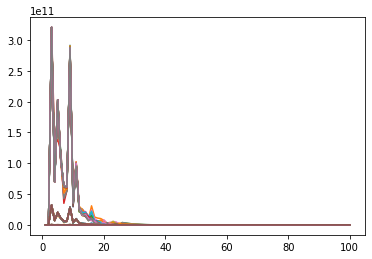

In [20]:
vary_lambda_content_n_style()